In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score

import datetime

%matplotlib inline

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Read FY2017 Detailed History

In [2]:
det_2017 = pd.read_excel('./FY17 DETAIL HISTORY TB AS OF PERIOD 13.xlsx')

In [3]:
det_2017.head()

,ORG,ACCOUNT,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
0,0,0000-000-104000-,CASH AND INVESTMENTS-TREASURER,17/,5,07/01/16,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1,0,0000-000-169000-,DUE FROM GENERAL FUND,17/,5,07/01/16,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
2,0,0000-000-202000-,ACCOUNTS PAYABLE,17/,5,07/01/16,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
3,0,0000-000-231000-,DUE TO GENERAL FUND,17/,5,07/01/16,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
4,0,0000-000-258000-,MISCELLANEOUS LIABILITIES,17/,5,07/01/16,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN


In [4]:
det_2017.shape

(90176, 18)

In [5]:
det_2017.dtypes

ORG                     int64
ACCOUNT                object
ACCOUNT DESC           object
YR/PR                  object
JNL                     int64
EFF DATE               object
SRC                    object
REF1                   object
REF2                   object
REF3                   object
CHECK #               float64
OB                     object
JOURNAL AMOUNT        float64
SOY BALANCE           float64
NET LEDGER BALANCE    float64
ORIGINAL BUDGET       float64
REVISED BUDGET        float64
NET BUDGET BALANCE    float64
dtype: object

In [6]:
det_2017['EFF DATE'] = pd.to_datetime(det_2017['EFF DATE'])

In [7]:
det_2017.dtypes

ORG                            int64
ACCOUNT                       object
ACCOUNT DESC                  object
YR/PR                         object
JNL                            int64
EFF DATE              datetime64[ns]
SRC                           object
REF1                          object
REF2                          object
REF3                          object
CHECK #                      float64
OB                            object
JOURNAL AMOUNT               float64
SOY BALANCE                  float64
NET LEDGER BALANCE           float64
ORIGINAL BUDGET              float64
REVISED BUDGET               float64
NET BUDGET BALANCE           float64
dtype: object

# Find unique `ORG` numbers

In [8]:
det_2017['ORG'].value_counts()

1         16781
60         2023
1001       1953
330908     1717
390902     1581
340908     1255
310908     1166
14202       998
1705        933
12101       905
1801        816
1803        785
12201       777
11457       753
320902      749
1724        741
8910        711
12202       686
1816        670
1432        625
330902      620
11251       605
84021       582
12102       575
1875        548
2529        538
1768        534
320908      514
1749        495
60001       480
320708      473
1740        464
1831        460
1862        458
8402        435
16101       421
14201       411
18031       407
320608      394
1610        386
1835        377
1870        368
321008      368
1833        354
321208      352
320308      352
320208      340
1620        331
1503        330
2512        327
1711        322
14321       318
2515        314
320808      311
321108      306
11252       302
2511        302
14204       301
320108      300
320408      297
604301      291
1710        290
18011   

# Find unique `Account` numbers

In [9]:
det_2017['ACCOUNT'].value_counts()

01  -000-104000-                          2132
01  -000-393000-                          1861
01  -000-386000-                          1799
01  -000-396000-                          1799
01  -000-202000-                          1731
01  -300-390-000-02-09-593006-             707
01  -100-145-700-00-00-571900-             697
01  -300-340-000-08-09-542205-             624
01  -000-213000-                           546
01  -000-213500-                           546
01  -000-212000-                           545
01  -300-330-000-08-09-535105-             542
01  -300-390-000-02-09-591006-             541
01  -300-330-000-02-09-533024-             531
01  -300-320-000-02-09-524404-             499
60  -000-104000-                           461
01  -000-126216-                           440
01  -000-391000-                           404
8402-100-121-001-00-00-431200-             371
1803-600-650-001-00-00-530000-             341
01  -300-390-000-02-09-594006-             333
01  -000-2140

# Split account numbers at delimeter `-`

In [10]:
account_df = det_2017['ACCOUNT'].str.split('-', expand=True)

account_df.columns = (['seg1', 'seg2', 'seg3', 'seg4', 'seg5', 'seg6', 'seg7', 'seg8'])

In [11]:
account_df.head()

,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8
0,0000,000,104000,,None,None,None,None
1,0000,000,169000,,None,None,None,None
2,0000,000,202000,,None,None,None,None
3,0000,000,231000,,None,None,None,None
4,0000,000,258000,,None,None,None,None


In [12]:
account_df.isnull().sum()

seg1        0
seg2        0
seg3        0
seg4        1
seg5    51976
seg6    51976
seg7    51976
seg8    51976
dtype: int64

# Separate `ACCOUNT` by delimiter in main dataframe

In [13]:
df = pd.concat([det_2017, account_df], axis=1)
df = df[['ORG', 'ACCOUNT', 'seg1', 'seg2', 'seg3', 'seg4',
       'seg5', 'seg6', 'seg7', 'seg8', 'ACCOUNT DESC', 'YR/PR', 'JNL', 'EFF DATE', 'SRC',
       'REF1', 'REF2', 'REF3', 'CHECK #', 'OB', 'JOURNAL AMOUNT',
       'SOY BALANCE', 'NET LEDGER BALANCE', 'ORIGINAL BUDGET',
       'REVISED BUDGET', 'NET BUDGET BALANCE']]

In [14]:
df.head()

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
0,0,0000-000-104000-,0000,000,104000,,None,None,None,None,CASH AND INVESTMENTS-TREASURER,17/,5,2016-07-01,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
1,0,0000-000-169000-,0000,000,169000,,None,None,None,None,DUE FROM GENERAL FUND,17/,5,2016-07-01,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
2,0,0000-000-202000-,0000,000,202000,,None,None,None,None,ACCOUNTS PAYABLE,17/,5,2016-07-01,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
3,0,0000-000-231000-,0000,000,231000,,None,None,None,None,DUE TO GENERAL FUND,17/,5,2016-07-01,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN
4,0,0000-000-258000-,0000,000,258000,,None,None,None,None,MISCELLANEOUS LIABILITIES,17/,5,2016-07-01,SOY,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN


# CLEAN DATA BY `seg7` starting with 5

In [15]:
df = df[df['seg7'] != '']

In [16]:
df = df[df['seg7'] != '00']

In [17]:
df = df[df['seg7'].notnull()]

In [18]:
df.shape

(38117, 26)

In [19]:
df.head()

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
16792,1001,01 -000-001-000-00-00-412000-,01,000,001,000,00,00,412000,,REAL ESTATE/PERSONAL PROP. TAX,17/ 1,53,2016-07-01,GEN,FY2017,NaN,NaN,NaN,NaN,-41943.28,NaN,-41943.28,NaN,-82651350.0,NaN
16793,1001,01 -000-001-000-00-00-412000-,01,000,001,000,00,00,412000,,REAL ESTATE/PERSONAL PROP. TAX,17/ 1,53,2016-07-01,GEN,FY2017,NaN,NaN,NaN,NaN,-1686.18,NaN,-43629.46,NaN,NaN,NaN
16794,1001,01 -000-001-000-00-00-412000-,01,000,001,000,00,00,412000,,REAL ESTATE/PERSONAL PROP. TAX,17/ 1,53,2016-07-01,GEN,FY2017,NaN,NaN,NaN,NaN,-5080.72,NaN,-48710.18,NaN,NaN,NaN
16795,1001,01 -000-001-000-00-00-412000-,01,000,001,000,00,00,412000,,REAL ESTATE/PERSONAL PROP. TAX,17/ 1,53,2016-07-01,GEN,FY2017,NaN,NaN,NaN,NaN,-11953.57,NaN,-60663.75,NaN,NaN,NaN
16796,1001,01 -000-001-000-00-00-412000-,01,000,001,000,00,00,412000,,REAL ESTATE/PERSONAL PROP. TAX,17/ 1,53,2016-07-01,GEN,FY2017,NaN,NaN,NaN,NaN,-2056.62,NaN,-62720.37,NaN,NaN,NaN


In [20]:
df['JOURNAL AMOUNT'].value_counts()

 75.00          520
 300.00         206
 80.00          178
 600.00         176
 500.00         174
-25.00          140
 2021.83        132
 100.00         130
 800.00         128
 30.00          121
 375.00         113
-50.00           95
 150.00          89
 40.00           89
 1708.37         88
 1569.19         88
 2042.96         88
 200.00          86
 108.33          86
 384.62          86
 60.00           84
-100.00          83
 50.00           81
 1534.48         80
 58.00           75
 885.75          72
 34.62           71
 38.46           69
 951.31          67
 868.57          64
 813.23          64
 6809.22         61
 1000.00         61
 350.00          60
 250.00          59
-200.00          55
 76.50           54
 1036.10         53
 225.00          53
 2300.88         53
 2400.92         53
 2353.85         53
 2629.63         52
 1878.55         52
 2795.84         52
 4745.19         52
 1059.23         52
 1197.07         52
 2924.41         52
 2814.87         52


# EXPENDITURES DATA

In [21]:
seg7_starts_w5 = df['seg7'].str.startswith('5')
expenditures = df[seg7_starts_w5]

In [22]:
expenditures.head()

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
18745,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172064,419775.0,NaN,12250.0,NaN,12250.0,NaN,183932.5,NaN
18746,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172065,419775.0,NaN,12250.0,NaN,24500.0,NaN,NaN,NaN
18747,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 4,134,2016-10-12,API,026540,20175151,173965,420766.0,NaN,12250.0,NaN,36750.0,NaN,NaN,NaN
18748,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 5,115,2016-11-09,API,026540,20175151,175569,421554.0,NaN,12250.0,NaN,49000.0,NaN,NaN,NaN
18749,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 6,89,2016-12-07,API,026540,20175151,177081,422202.0,NaN,12250.0,NaN,61250.0,NaN,NaN,NaN


In [23]:
expenditures.shape

(30892, 26)

In [24]:
expenditures['ACCOUNT DESC'].value_counts()

PERMANENT SALARIES                2765
REVOLVING ACCOUNT EXPENSES        1147
EDUCATIONAL INCENTIVE             1122
CLASSROOM TEACHERS                1030
PURCHASE OF SERVICES               984
ADDITIONAL DIFFERENTIAL            868
OFFICE SUPPLIES                    838
TUITION TO NON PUBLIC SCHOOLS      707
TAX TITLE                          697
MAINTENANCE OF BUILDINGS           624
INSTRUCTIONAL MATERIALS            598
BUILDING SECRETARIES               583
PRINCIPALS                         583
BUILDING MAINTENANCE & REPAIR      551
ATHLETIC SUPPLIES & MATS           542
TUITION TO MASS SCHOOLS            541
SPED OUTSIDE TRANSPORTATION        531
ASSISTANT PRINCIPALS               507
SPED 504 SERVICES                  499
SUBSTITUTES                        486
SOCIAL WORKERS                     405
MEDICAL EXPENSES                   381
BUILDING TECHNOLOGISTS             370
MAINTENANCE OF EQUIPMENT           361
SPECIALIST TEACHERS                359
TUITION TO COLLABORATIVES

In [25]:
objects = list(expenditures.seg7.unique())

In [26]:
expenditures['seg7'].value_counts()

510100    2765
511100    1171
530000    1146
512301    1122
523051    1030
520000     984
540000     838
593006     707
571900     697
542205     624
524115     598
522102     583
522101     583
524500     551
535105     542
591006     541
533024     531
522111     507
524404     499
523253     486
528001     405
512000     381
522503     370
523101     359
570000     348
594006     333
580000     316
512100     313
520300     312
524200     306
510900     304
524600     299
570500     266
544000     257
533034     249
571500     246
520900     241
552026     236
527101     225
511900     201
541305     197
511500     194
525000     193
521600     189
541315     187
510101     160
541500     157
521102     140
512400     129
533005     129
544004     124
520800     112
533003     108
541104     106
542200      99
587100      98
523303      95
541113      83
533004      82
529400      81
534006      73
526100      73
511106      72
510800      71
522200      70
525600      70
520500    

In [27]:
len(objects)

266

In [28]:
expenditures.groupby(['seg7', 'JOURNAL AMOUNT'])['ORG'].count().sort_values()

seg7    JOURNAL AMOUNT
510100  -259176.63          1
532005   110.16             1
         125.82             1
         164.45             1
         176.08             1
         264.12             1
         268.40             1
         351.01             1
         450.00             1
         462.00             1
         831.09             1
         96.45              1
         1034.38            1
         1343.49            1
         1749.42            1
         2141.70            1
         2745.09            1
         2805.00            1
         4560.00            1
         4653.10            1
         11250.00           1
533001   2982.48            1
533002   858.04             1
532005   1035.00            1
         88.19              1
         84.62              1
         26.84              1
530000   183165.87          1
         184467.00          1
         199192.01          1
         206775.04          1
         222320.64          1
         222815.4

In [29]:
expenditures.groupby(['ACCOUNT DESC', 'ACCOUNT' ])['ORG'].count()

ACCOUNT DESC                    ACCOUNT                       
ADDITIONAL DIFFERENTIAL         01  -100-111-100-00-00-511100-     14
                                01  -100-135-100-00-00-511100-     53
                                01  -100-138-100-00-00-511100-     54
                                01  -100-141-100-00-00-511100-     53
                                01  -100-145-100-00-00-511100-     53
                                01  -100-151-100-00-00-511100-     53
                                01  -100-161-100-00-00-511100-     53
                                01  -100-162-100-00-00-511100-     54
                                01  -200-210-100-00-00-511100-     54
                                01  -200-220-100-00-00-511100-     55
                                01  -200-241-100-00-00-511100-     54
                                01  -200-244-100-00-00-511100-     46
                                01  -400-420-100-00-00-511100-     56
                           

# Benford's Law

In [413]:
expenditures = expenditures.astype({'JOURNAL AMOUNT': float})

In [414]:
expenditures = expenditures[expenditures['JOURNAL AMOUNT'] >=0]

In [415]:
expenditures['JOURNAL AMOUNT'].value_counts()

75.00          515
300.00         201
80.00          177
600.00         174
500.00         167
2021.83        132
30.00          113
375.00         110
100.00         100
40.00           88
1708.37         88
1569.19         88
2042.96         88
384.62          86
108.33          86
150.00          86
200.00          83
1534.48         80
800.00          79
60.00           75
58.00           74
50.00           74
885.75          72
34.62           71
38.46           69
951.31          67
868.57          64
813.23          64
6809.22         61
250.00          59
350.00          56
76.50           54
2400.92         53
2300.88         53
1036.10         53
2353.85         53
1000.00         53
2814.87         52
2489.85         52
2680.46         52
348.40          52
939.77          52
2795.84         52
1197.07         52
225.00          52
1115.86         52
26.45           52
443.22          52
2307.69         52
2924.41         52
4745.19         52
2469.23         52
1059.23     

In [416]:
expenditures['FIRST_DIGIT'] = expenditures['JOURNAL AMOUNT'].map(lambda a: str(a)[0])

In [417]:
expenditures[['JOURNAL AMOUNT', 'FIRST_DIGIT']].head(20)

,JOURNAL AMOUNT,FIRST_DIGIT
18745,12250.00,1
18746,12250.00,1
18747,12250.00,1
18748,12250.00,1
18749,12250.00,1
18750,12250.00,1
18751,12250.00,1
18752,12250.00,1
18753,12250.00,1
18754,12250.00,1


In [418]:
actual_percentages = expenditures['FIRST_DIGIT'].value_counts(normalize=True).sort_index()

In [419]:
actual_percentages = actual_percentages[1:10]

In [420]:
digits = list(range(1,10))
benford_percentages = [np.log10(1+(1/d)) for d in digits]

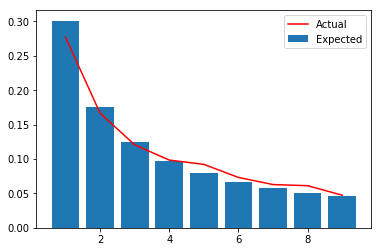

In [421]:
plt.bar(digits, benford_percentages, label='Expected')
plt.plot(digits, actual_percentages, c='r', label='Actual')
plt.legend();

# Number of Departments by `seg3`

In [422]:
expenditures.head(2)

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18745,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172064,419775.00,NaN,12250.00,nan,12250.00,nan,183932.50,nan,1
18746,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172065,419775.00,NaN,12250.00,nan,24500.00,nan,nan,nan,1


In [423]:
len(expenditures['seg3'].unique())

52

In [424]:
expenditures['seg3'].unique()

array(['300', '111', '121', '122', '125', '127', '135', '138', '140',
       '141', '145', '151', '161', '162', '165', '171', '176', '181',
       '182', '184', '420', '543', '990', '210', '211', '220', '230',
       '241', '244', '310', '320', '330', '340', '390', '460', '521',
       '522', '524', '525', '541', '549', '590', '610', '650', '800',
       '911', '000', '001', '440', '450', '470', '430'], dtype=object)

In [425]:
num_of_exp_by_account_desc = expenditures['ACCOUNT DESC'].value_counts()
num_of_exp_by_account_desc

PERMANENT SALARIES                2671
EDUCATIONAL INCENTIVE             1106
REVOLVING ACCOUNT EXPENSES        1024
CLASSROOM TEACHERS                1003
PURCHASE OF SERVICES               957
ADDITIONAL DIFFERENTIAL            859
OFFICE SUPPLIES                    777
TUITION TO NON PUBLIC SCHOOLS      702
MAINTENANCE OF BUILDINGS           617
BUILDING SECRETARIES               583
PRINCIPALS                         583
BUILDING MAINTENANCE & REPAIR      548
TAX TITLE                          544
TUITION TO MASS SCHOOLS            541
ATHLETIC SUPPLIES & MATS           531
SPED OUTSIDE TRANSPORTATION        525
ASSISTANT PRINCIPALS               505
INSTRUCTIONAL MATERIALS            504
SPED 504 SERVICES                  498
SUBSTITUTES                        477
SOCIAL WORKERS                     405
MEDICAL EXPENSES                   378
BUILDING TECHNOLOGISTS             370
SPECIALIST TEACHERS                358
MAINTENANCE OF EQUIPMENT           357
TUITION TO COLLABORATIVES

In [426]:
mask = num_of_exp_by_account_desc >= 500
num_of_exp_by_account_desc[mask]

PERMANENT SALARIES               2671
EDUCATIONAL INCENTIVE            1106
REVOLVING ACCOUNT EXPENSES       1024
CLASSROOM TEACHERS               1003
PURCHASE OF SERVICES              957
ADDITIONAL DIFFERENTIAL           859
OFFICE SUPPLIES                   777
TUITION TO NON PUBLIC SCHOOLS     702
MAINTENANCE OF BUILDINGS          617
BUILDING SECRETARIES              583
PRINCIPALS                        583
BUILDING MAINTENANCE & REPAIR     548
TAX TITLE                         544
TUITION TO MASS SCHOOLS           541
ATHLETIC SUPPLIES & MATS          531
SPED OUTSIDE TRANSPORTATION       525
ASSISTANT PRINCIPALS              505
INSTRUCTIONAL MATERIALS           504
Name: ACCOUNT DESC, dtype: int64

In [427]:
large_depts = num_of_exp_by_account_desc[mask].index
large_depts

Index(['PERMANENT SALARIES', 'EDUCATIONAL INCENTIVE',
       'REVOLVING ACCOUNT EXPENSES', 'CLASSROOM TEACHERS',
       'PURCHASE OF SERVICES', 'ADDITIONAL DIFFERENTIAL', 'OFFICE SUPPLIES',
       'TUITION TO NON PUBLIC SCHOOLS', 'MAINTENANCE OF BUILDINGS',
       'BUILDING SECRETARIES', 'PRINCIPALS', 'BUILDING MAINTENANCE & REPAIR',
       'TAX TITLE', 'TUITION TO MASS SCHOOLS', 'ATHLETIC SUPPLIES & MATS',
       'SPED OUTSIDE TRANSPORTATION', 'ASSISTANT PRINCIPALS',
       'INSTRUCTIONAL MATERIALS'],
      dtype='object')

In [428]:
for i, dept in enumerate(large_depts):
    print(i, dept)

0 PERMANENT SALARIES
1 EDUCATIONAL INCENTIVE
2 REVOLVING ACCOUNT EXPENSES
3 CLASSROOM TEACHERS
4 PURCHASE OF SERVICES
5 ADDITIONAL DIFFERENTIAL
6 OFFICE SUPPLIES
7 TUITION TO NON PUBLIC SCHOOLS
8 MAINTENANCE OF BUILDINGS
9 BUILDING SECRETARIES
10 PRINCIPALS
11 BUILDING MAINTENANCE & REPAIR
12 TAX TITLE
13 TUITION TO MASS SCHOOLS
14 ATHLETIC SUPPLIES & MATS
15 SPED OUTSIDE TRANSPORTATION
16 ASSISTANT PRINCIPALS
17 INSTRUCTIONAL MATERIALS


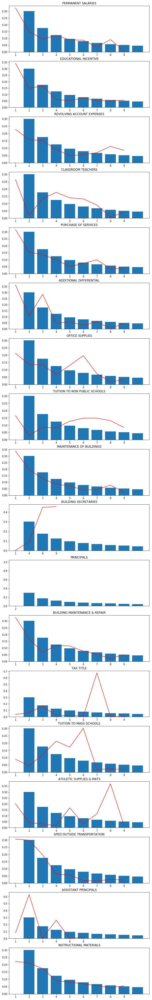

In [429]:
fig, axes = plt.subplots(nrows=len(large_depts), figsize=(10, 4*len(large_depts)))
for i, dept in enumerate(large_depts):
    # Filter df to only have the checks from dept
    dept_checks = expenditures[expenditures['ACCOUNT DESC'] == dept]
    
    # Get the percentages of FIRST_DIGIT for that filter
    dept_percentages = dept_checks.FIRST_DIGIT.value_counts(normalize=True).sort_index()
    
    # Plot the expected benford percentages as a bar chart
    axes[i].bar(digits, benford_percentages)
    
    #Add the dept as a title on each axis
    axes[i].set_title(dept)
    
    # Plot the dept actual percentages as a line chart
    axes[i].plot(dept_percentages, color='r')
    

## Check `ACCOUNT DESC` with anomoalies per Benford Percentages

### `CLASSROOM TEACHERS`

#### `first_digit` = 3

In [706]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '3'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18840,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
20003,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,3849.39,nan,3849.39,nan,226337.77,nan,3
20004,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,3849.39,nan,7698.78,nan,nan,nan,3
20005,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,3849.39,nan,11548.17,nan,nan,nan,3
20006,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,3849.39,nan,15397.56,nan,nan,nan,3
20007,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,3849.39,nan,19246.95,nan,nan,nan,3
20008,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,3849.39,nan,23096.34,nan,nan,nan,3
20009,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,3849.39,nan,26945.73,nan,nan,nan,3
20010,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,3849.39,nan,30795.12,nan,nan,nan,3
20011,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,3849.39,nan,34644.51,nan,nan,nan,3


In [707]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count      135.00
mean     32181.47
std      52028.33
min       3246.99
25%       3849.39
50%      33925.25
75%      35007.72
max     380855.47
Name: JOURNAL AMOUNT, dtype: float64

In [708]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

3849.39      42
33990.97     16
34897.53     13
33925.25     12
33691.70     11
37618.67      9
37970.40      7
33904.12      4
35117.91      4
38036.03      3
36455.07      2
36240.77      1
36063.64      1
37123.15      1
35223.25      1
380855.47     1
336887.83     1
366789.08     1
36687.10      1
30795.12      1
36274.65      1
3246.99       1
3935.33       1
Name: JOURNAL AMOUNT, dtype: int64

(array([132.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   2.]),
 array([  3246.99 ,  41007.838,  78768.686, 116529.534, 154290.382,
        192051.23 , 229812.078, 267572.926, 305333.774, 343094.622,
        380855.47 ]),
 <a list of 10 Patch objects>)

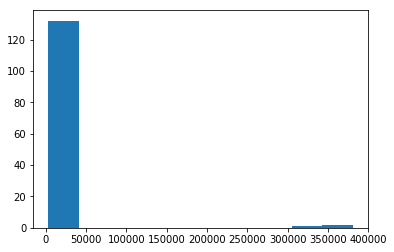

In [709]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f853a940>,
 'caps': [<matplotlib.lines.Line2D at 0x202f853aef0>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f853a7f0>],
 'medians': [<matplotlib.lines.Line2D at 0x202f85425c0>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f8542908>],
 'means': []}

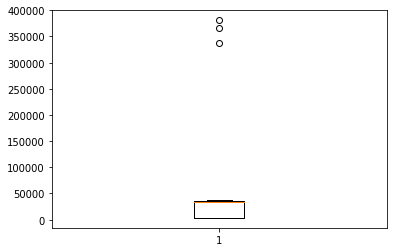

In [710]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [712]:
CLASSROOM_TEACHERS_3_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 300_000]
CLASSROOM_TEACHERS_3_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,3.00,320567.67,378.59,320301.00,320351.00,320401.00,320701.00,321001.00
JNL,3.00,459.00,0.00,459.00,459.00,459.00,459.00,459.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,3.00,361510.79,22454.03,336887.83,351838.46,366789.08,373822.28,380855.47
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,3.00,2369733.84,106545.61,2255033.75,2321791.71,2388549.67,2427083.88,2465618.09
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 4

In [713]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18794,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,46225.91,nan,46225.91,nan,2516367.78,nan,4
18795,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,45737.99,nan,91963.90,nan,nan,nan,4
18796,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,45737.99,nan,137701.89,nan,nan,nan,4
18797,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,45737.99,nan,183439.88,nan,nan,nan,4
18799,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,45737.99,nan,227643.39,nan,nan,nan,4
18800,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,45737.99,nan,273381.38,nan,nan,nan,4
18801,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,45737.99,nan,319119.37,nan,nan,nan,4
18802,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,45737.99,nan,364857.36,nan,nan,nan,4
18803,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,45737.99,nan,410595.35,nan,nan,nan,4
18804,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,45737.99,nan,456333.34,nan,nan,nan,4


In [714]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count      177.00
mean     45502.37
std      63749.90
min       4150.59
25%      40907.92
50%      45737.99
75%      46350.08
max     471233.23
Name: JOURNAL AMOUNT, dtype: float64

In [715]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4549.14      28
45952.27     20
47916.03     15
45737.99     10
42616.29      9
43665.91      7
47413.02      6
44077.20      6
40907.92      6
46128.18      6
4375.21       5
47784.59      5
47850.40      4
44419.81      4
44142.83      4
4483.39       4
46207.66      4
46350.08      4
42785.17      3
46686.94      3
42500.09      2
414489.44     1
471233.23     1
4865.37       1
49454.41      1
46069.20      1
42871.37      1
42460.08      1
4150.59       1
43063.14      1
46895.40      1
47603.11      1
47395.53      1
42225.48      1
46714.82      1
46225.91      1
438073.17     1
48980.07      1
42978.98      1
467018.04     1
41839.44      1
41126.47      1
47246.24      1
Name: JOURNAL AMOUNT, dtype: int64

(array([173.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   3.]),
 array([  4150.59 ,  50858.854,  97567.118, 144275.382, 190983.646,
        237691.91 , 284400.174, 331108.438, 377816.702, 424524.966,
        471233.23 ]),
 <a list of 10 Patch objects>)

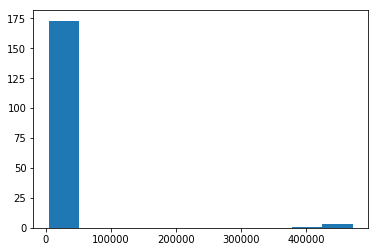

In [716]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f999b3c8>,
 'caps': [<matplotlib.lines.Line2D at 0x202f999ba58>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f999b278>],
 'medians': [<matplotlib.lines.Line2D at 0x202f9974128>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f9974470>],
 'means': []}

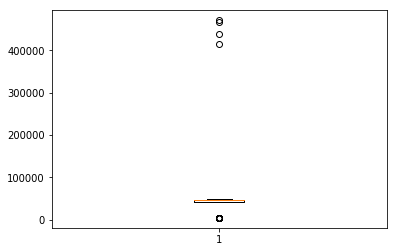

In [717]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [719]:
CLASSROOM_TEACHERS_4_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 400_000]
CLASSROOM_TEACHERS_4_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,4.00,320776.00,464.58,320201.00,320501.00,320851.00,321126.00,321201.00
JNL,4.00,459.00,0.00,459.00,459.00,459.00,459.00,459.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,4.00,447703.47,26599.60,414489.44,432177.24,452545.60,468071.84,471233.23
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,4.00,2968513.16,187646.68,2731575.55,2862426.75,3002321.31,3108407.72,3137834.47
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 5

In [727]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18807,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 5,283,2016-11-10,PRJ,SCHOOL,117115,117115,nan,NaN,50420.07,nan,552391.40,nan,nan,nan,5
19238,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,53782.01,nan,53782.01,nan,3123051.23,nan,5
19239,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,54991.80,nan,108773.81,nan,nan,nan,5
19240,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,54991.80,nan,163765.61,nan,nan,nan,5
19241,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,54991.80,nan,218757.41,nan,nan,nan,5
19242,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,54690.60,nan,273448.01,nan,nan,nan,5
19243,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,55293.00,nan,328741.01,nan,nan,nan,5
19244,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,54991.80,nan,383732.81,nan,nan,nan,5
19245,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,54991.80,nan,438724.61,nan,nan,nan,5
19246,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,54991.80,nan,493716.41,nan,nan,nan,5


In [728]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     140.00
mean    42081.15
std     21112.32
min      5185.04
25%     39274.60
50%     52028.56
75%     54991.80
max     59985.62
Name: JOURNAL AMOUNT, dtype: float64

In [729]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5905.78     28
52028.56    22
54752.55    10
54991.80     8
51549.69     7
55169.22     7
51897.18     5
54818.20     4
55234.95     4
56031.41     3
54535.40     3
50733.83     3
5886.61      2
58585.36     2
50397.54     2
59146.57     2
5504.71      2
5323.46      1
58984.56     1
57794.42     1
51192.89     1
54690.60     1
5185.04      1
53969.12     1
59776.17     1
59985.62     1
51764.18     1
58977.49     1
55719.67     1
56649.49     1
57120.87     1
54830.09     1
50600.94     1
50420.07     1
51340.67     1
57747.33     1
5847.73      1
59647.60     1
55293.00     1
59242.79     1
59039.84     1
59311.11     1
53782.01     1
Name: JOURNAL AMOUNT, dtype: int64

(array([35.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 46., 59.]),
 array([ 5185.04 , 10665.098, 16145.156, 21625.214, 27105.272, 32585.33 ,
        38065.388, 43545.446, 49025.504, 54505.562, 59985.62 ]),
 <a list of 10 Patch objects>)

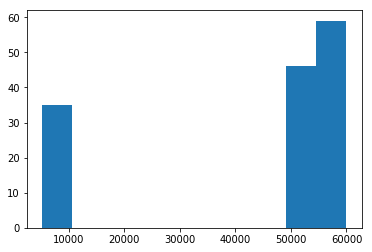

In [730]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f676ce10>,
 'caps': [<matplotlib.lines.Line2D at 0x202f677e518>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f676ccc0>],
 'medians': [<matplotlib.lines.Line2D at 0x202f677eba8>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f677eef0>],
 'means': []}

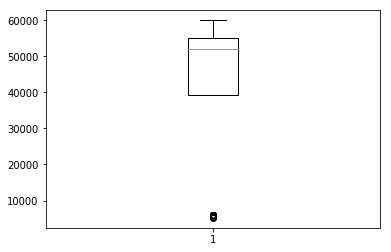

In [731]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [733]:
CLASSROOM_TEACHERS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 10_000]
CLASSROOM_TEACHERS_5_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,35.00,320439.14,159.20,320102.00,320402.00,320402.00,320402.00,320802.00
JNL,35.00,364.29,105.91,142.00,283.50,383.00,442.00,512.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,35.00,5842.88,175.39,5185.04,5905.78,5905.78,5905.78,5905.78
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,35.00,178631.51,85549.27,5847.73,135530.85,176707.92,226907.05,477374.60
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,206495.33,nan,206495.33,206495.33,206495.33,206495.33,206495.33
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 6

In [734]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
19237,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,60150.56,nan,390978.56,nan,nan,nan,6
30253,320801,01 -300-320-000-01-08-523051-,01,300,320,000,01,08,523051,,CLASSROOM TEACHERS,17/12,497,2017-06-30,PRJ,CITY,1170636,1170636,nan,NaN,689.47,nan,718548.62,nan,nan,nan,6
30316,320102,01 -300-320-000-02-01-523051-,01,300,320,000,02,01,523051,,CLASSROOM TEACHERS,17/ 5,307,2016-11-25,PRJ,SCHOOL,1171129,1171129,nan,NaN,6060.35,nan,100605.71,nan,nan,nan,6
30483,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,6348.18,nan,6348.18,nan,371967.21,nan,6
30484,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,6348.18,nan,12696.36,nan,nan,nan,6
30485,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,6348.18,nan,19044.54,nan,nan,nan,6
30486,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,6348.18,nan,25392.72,nan,nan,nan,6
30487,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,6348.18,nan,31740.90,nan,nan,nan,6
30488,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,6348.18,nan,38089.08,nan,nan,nan,6
30489,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,6348.18,nan,44437.26,nan,nan,nan,6


In [735]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     132.00
mean    36852.05
std     27082.22
min       689.47
25%      6413.93
50%     60065.38
75%     60376.62
max     68158.93
Name: JOURNAL AMOUNT, dtype: float64

In [736]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

6413.93     28
60645.66    27
60286.94    21
6348.18     16
60065.38    11
6968.72     11
60119.84     6
64786.76     1
60252.40     1
689.47       1
61281.60     1
6909.37      1
66616.29     1
64282.91     1
62362.35     1
6060.35      1
60150.56     1
68158.93     1
60206.49     1
Name: JOURNAL AMOUNT, dtype: int64

(array([58.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 69.,  5.]),
 array([  689.47 ,  7436.416, 14183.362, 20930.308, 27677.254, 34424.2  ,
        41171.146, 47918.092, 54665.038, 61411.984, 68158.93 ]),
 <a list of 10 Patch objects>)

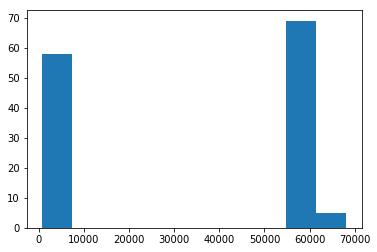

In [737]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202efb7b8d0>,
 'caps': [<matplotlib.lines.Line2D at 0x202efb46048>,
 'boxes': [<matplotlib.lines.Line2D at 0x202efb7b780>],
 'medians': [<matplotlib.lines.Line2D at 0x202efb466d8>],
 'fliers': [<matplotlib.lines.Line2D at 0x202efb46a20>],
 'means': []}

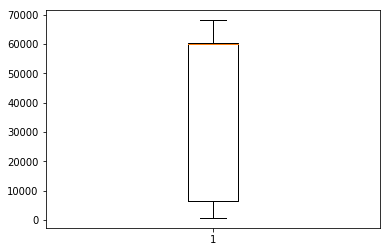

In [738]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [743]:
CLASSROOM_TEACHERS_6_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 10_000]
CLASSROOM_TEACHERS_6_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,58.00,320334.74,101.47,320102.00,320302.00,320302.00,320302.00,320802.00
JNL,58.00,349.66,101.58,139.00,280.75,350.00,436.00,512.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,58.00,6404.76,801.20,689.47,6348.18,6413.93,6413.93,6968.72
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,58.00,131873.07,114035.07,6348.18,52026.52,104777.85,196176.35,718548.62
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,382984.52,15580.83,371967.21,377475.87,382984.52,388493.17,394001.83
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [744]:
CLASSROOM_TEACHERS_6_outliers_b = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 10_000]
CLASSROOM_TEACHERS_6_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,74.00,320399.66,219.95,320201.00,320201.00,320201.00,320601.00,321202.00
JNL,74.00,345.81,107.24,139.00,277.00,350.00,433.00,512.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,74.00,60716.15,1355.44,60065.38,60217.97,60286.94,60645.66,68158.93
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,74.00,1257071.84,702010.98,60065.38,719709.29,1265528.17,1810760.49,2607358.45
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,3005757.65,nan,3005757.65,3005757.65,3005757.65,3005757.65,3005757.65
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 7

In [745]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
19193,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,7302.39,nan,7302.39,nan,378987.96,nan,7
19194,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,7302.39,nan,14604.78,nan,nan,nan,7
19195,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,7302.39,nan,21907.17,nan,nan,nan,7
19196,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,7302.39,nan,29209.56,nan,nan,nan,7
19197,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,7302.39,nan,36511.95,nan,nan,nan,7
19198,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,7302.39,nan,43814.34,nan,nan,nan,7
19199,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,7302.39,nan,51116.73,nan,nan,nan,7
19200,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,7302.39,nan,58419.12,nan,nan,nan,7
19201,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,7302.39,nan,65721.51,nan,nan,nan,7
19202,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,7302.39,nan,73023.90,nan,nan,nan,7


In [746]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count      90.00
mean     8104.28
std      6869.43
min      7003.43
25%      7302.39
50%      7328.24
75%      7518.82
max     72538.16
Name: JOURNAL AMOUNT, dtype: float64

In [747]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

7518.82     32
7328.24     26
7272.72     15
7302.39     11
7003.43      2
7110.59      1
7385.26      1
7790.52      1
72538.16     1
Name: JOURNAL AMOUNT, dtype: int64

(array([89.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 7003.43 , 13556.903, 20110.376, 26663.849, 33217.322, 39770.795,
        46324.268, 52877.741, 59431.214, 65984.687, 72538.16 ]),
 <a list of 10 Patch objects>)

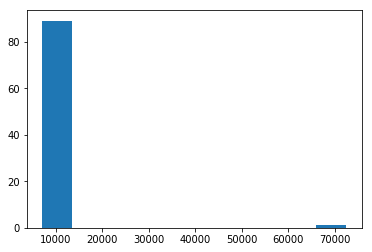

In [748]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202ef3930f0>,
 'caps': [<matplotlib.lines.Line2D at 0x202ef393780>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f0010f60>],
 'medians': [<matplotlib.lines.Line2D at 0x202ef393e10>],
 'fliers': [<matplotlib.lines.Line2D at 0x202ef38c198>],
 'means': []}

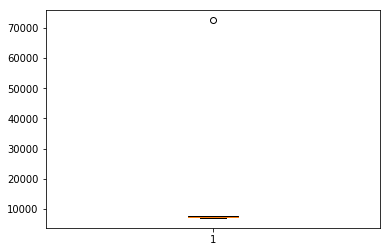

In [749]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [751]:
CLASSROOM_TEACHERS_7_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 60_000) & (first_digit_checks['JOURNAL AMOUNT'] < 80_000)]
CLASSROOM_TEACHERS_7_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,320502.00,nan,320502.00,320502.00,320502.00,320502.00,320502.00
JNL,1.00,459.00,nan,459.00,459.00,459.00,459.00,459.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,1.00,72538.16,nan,72538.16,72538.16,72538.16,72538.16,72538.16
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,474946.79,nan,474946.79,474946.79,474946.79,474946.79,474946.79
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


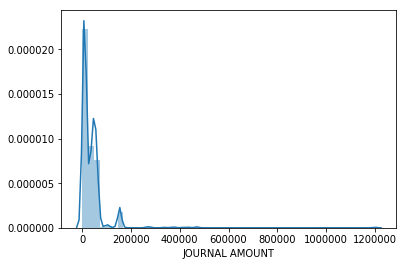

In [463]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'CLASSROOM TEACHERS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../classroom_teachers_journal_amounts.png')

In [464]:
dept['JOURNAL AMOUNT'].describe()

count      1003.00
mean      36869.34
std       60326.05
min         689.47
25%        7518.82
50%       18992.82
75%       47916.03
max     1201879.59
Name: JOURNAL AMOUNT, dtype: float64

### `ADDITIONAL DIFFERENTIAL`

#### `first_digit` = 3

In [752]:
dept = 'ADDITIONAL DIFFERENTIAL'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '3'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20062,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 1,120,2016-07-25,PRJ,CITY,0170728,0170728,nan,NaN,3216.67,nan,3216.67,nan,38300.00,nan,3
20065,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,134,2016-08-22,PRJ,MNTHLY,0170823,0170823,nan,NaN,3216.67,nan,6433.34,nan,nan,nan,3
20066,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 3,351,2016-09-26,PRJ,CITY,0170931,0170931,nan,NaN,3216.67,nan,9650.01,nan,nan,nan,3
20067,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 4,279,2016-10-24,PRJ,CITY,0171019,0171019,nan,NaN,3216.67,nan,12866.68,nan,nan,nan,3
20068,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 5,318,2016-11-28,PRJ,CITY,0171128,0171128,nan,NaN,3216.67,nan,16083.35,nan,nan,nan,3
20069,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 6,304,2016-12-19,PRJ,CITY,0171227,0171227,nan,NaN,3233.34,nan,19316.69,nan,nan,nan,3
20070,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 7,305,2017-01-23,PRJ,CITY,0170127,0170127,nan,NaN,3283.35,nan,22600.04,nan,nan,nan,3
20071,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 8,458,2017-02-27,PRJ,CITY,0170225,0170225,nan,NaN,3283.35,nan,25883.39,nan,nan,nan,3
20072,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 9,379,2017-03-27,PRJ,CITY,0170332,0170332,nan,NaN,3283.35,nan,29166.74,nan,nan,nan,3
20073,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/10,420,2017-04-24,PRJ,CITY,0170428,0170428,nan,NaN,3283.35,nan,32450.09,nan,nan,nan,3


In [753]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    245.00
mean    1186.82
std     1576.80
min       31.43
25%       38.46
50%       39.25
75%     3273.09
max     3994.21
Name: JOURNAL AMOUNT, dtype: float64

In [754]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

38.46      69
34.62      50
307.85     12
317.21      9
3273.09     9
314.45      7
3283.35     6
3253.89     6
3457.77     5
311.69      5
3216.67     5
3966.26     3
3234.69     3
3303.89     3
3380.83     3
3361.56     3
321.90      3
3994.21     3
3373.14     3
319.14      3
3982.69     2
3975.63     2
3367.35     2
3334.68     2
3965.83     2
3973.96     2
3446.22     2
3233.34     1
3338.52     1
341.43      1
3427.01     1
3465.46     1
312.39      1
3376.98     1
32.68       1
3400.08     1
3403.92     1
3242.37     1
3300.04     1
322.60      1
3411.61     1
324.66      1
3987.17     1
3167.05     1
31.43       1
38.35       1
3967.31     1
39.25       1
Name: JOURNAL AMOUNT, dtype: int64

(array([166.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,  62.,  16.]),
 array([  31.43 ,  427.708,  823.986, 1220.264, 1616.542, 2012.82 ,
        2409.098, 2805.376, 3201.654, 3597.932, 3994.21 ]),
 <a list of 10 Patch objects>)

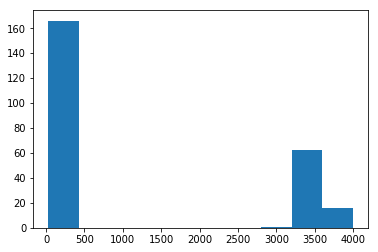

In [755]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202ef9518d0>,
 'caps': [<matplotlib.lines.Line2D at 0x202ef951f60>,
 'boxes': [<matplotlib.lines.Line2D at 0x202ef951780>],
 'medians': [<matplotlib.lines.Line2D at 0x202ef976630>],
 'fliers': [<matplotlib.lines.Line2D at 0x202ef976978>],
 'means': []}

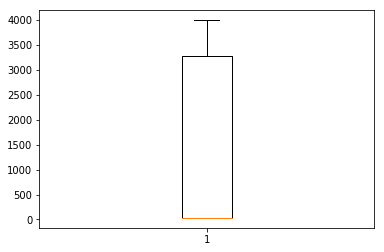

In [756]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [773]:
ADDITIONAL_DIFFERENTIAL_3_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 3_000) & (first_digit_checks['JOURNAL AMOUNT'] < 4_000)]
ADDITIONAL_DIFFERENTIAL_3_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,79.00,12013.91,386.67,11111.00,12101.00,12201.00,12201.00,12201.00
JNL,79.00,227.78,130.38,10.00,125.00,232.00,326.00,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,79.00,3452.04,275.33,3167.05,3273.09,3361.56,3457.77,3994.21
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,79.00,71011.37,54428.73,3167.05,26005.53,53133.90,116773.67,186629.27
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,117300.00,111722.87,38300.00,77800.00,117300.00,156800.00,196300.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [772]:
ADDITIONAL_DIFFERENTIAL_3_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 500)]
ADDITIONAL_DIFFERENTIAL_3_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,166.00,12405.16,1404.02,11351.00,11411.00,11621.00,12441.00,16101.00
JNL,166.00,241.77,132.53,10.00,132.00,260.00,347.00,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,166.00,108.79,122.18,31.43,34.62,38.46,307.85,341.43
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,166.00,2989.33,3707.47,61.47,844.15,1576.86,2698.05,16424.96
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


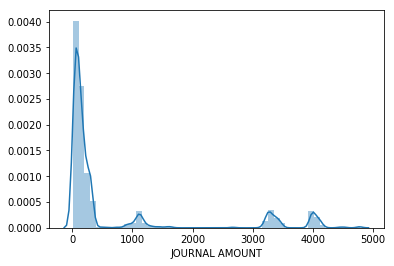

In [759]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'ADDITIONAL DIFFERENTIAL']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../additional_differential_journal_amounts.png')

In [760]:
dept['JOURNAL AMOUNT'].describe()

count    859.00
mean     673.90
std     1216.44
min       12.57
25%       73.08
50%      126.93
75%      307.85
max     4778.80
Name: JOURNAL AMOUNT, dtype: float64

### `OFFICE SUPPLIES`

#### `first_digit` = 5

In [774]:
dept = 'OFFICE SUPPLIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20334,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,209,2017-01-18,API,002632,20170307,179104,423145.00,NaN,5.18,nan,6501.10,nan,nan,nan,5
20335,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,217,2017-01-18,API,007017,20171391,179161,423125.00,NaN,542.00,nan,7043.10,nan,nan,nan,5
20369,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/12,362,2017-06-22,API,028310,20172515,187526,427026.00,NaN,57.63,nan,12438.69,nan,nan,nan,5
21579,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,301,2016-09-21,API,001370,20170672,172638,420079.00,NaN,550.00,nan,3395.87,nan,nan,nan,5
21589,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,321,2016-11-29,API,028486,NaN,176587,422086.00,B,500.47,nan,6717.15,nan,nan,nan,5
21595,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,57,2017-01-05,API,028486,20170945,178456,422832.00,B,505.03,nan,8800.90,nan,nan,nan,5
21605,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,61,2017-03-01,API,028710,20171734,181140,424019.00,B,511.60,nan,11335.77,nan,nan,nan,5
21610,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,214,2017-03-13,API,028710,20171734,181882,424505.00,B,511.60,nan,13085.57,nan,nan,nan,5
21611,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,344,2017-03-23,API,028710,20171734,182509,424656.00,B,511.60,nan,13597.17,nan,nan,nan,5
21612,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,447,2017-03-28,API,028710,20171734,182954,424836.00,B,511.60,nan,14108.77,nan,nan,nan,5


In [775]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   101.00
mean    312.04
std     260.00
min       5.18
25%      51.73
50%     511.60
75%     551.07
max     595.00
Name: JOURNAL AMOUNT, dtype: float64

In [776]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5.18      23
57.00     12
511.60    11
581.39     6
584.13     4
582.76     2
539.01     1
560.00     1
57.63      1
539.21     1
518.93     1
578.16     1
551.07     1
541.28     1
551.76     1
59.00      1
544.00     1
551.54     1
510.00     1
591.00     1
540.00     1
575.00     1
50.00      1
595.00     1
550.00     1
52.37      1
544.07     1
554.51     1
572.10     1
51.73      1
551.09     1
51.70      1
59.99      1
540.04     1
553.48     1
540.08     1
520.34     1
551.41     1
550.50     1
57.48      1
550.60     1
59.40      1
57.65      1
500.47     1
52.10      1
522.90     1
505.03     1
551.74     1
542.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([46.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 17., 38.]),
 array([  5.18 ,  64.162, 123.144, 182.126, 241.108, 300.09 , 359.072,
        418.054, 477.036, 536.018, 595.   ]),
 <a list of 10 Patch objects>)

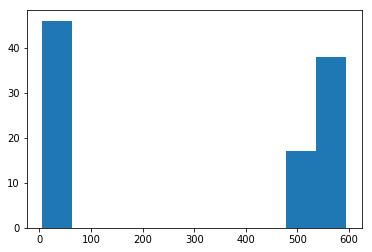

In [777]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f3581780>,
 'caps': [<matplotlib.lines.Line2D at 0x202f3581e48>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f3581630>],
 'medians': [<matplotlib.lines.Line2D at 0x202f3566518>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f35668d0>],
 'means': []}

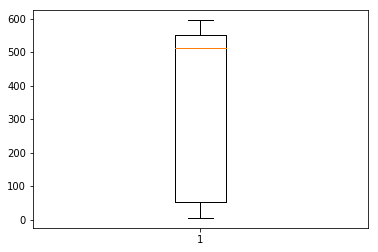

In [778]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [781]:
OFFICE_SUPPLIES_5_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 100]
OFFICE_SUPPLIES_5_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,46.00,11828.13,1032.53,11214.00,11424.00,11454.00,11514.00,15434.00
JNL,46.00,201.83,117.40,6.00,105.50,200.50,288.00,563.00
CHECK #,46.00,423302.28,2501.47,419256.00,421456.50,423329.50,425331.25,427390.00
JOURNAL AMOUNT,46.00,30.70,25.87,5.18,5.18,27.59,57.00,59.99
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,46.00,15658.12,16988.03,212.85,1246.44,6189.37,33030.39,47558.75
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [782]:
OFFICE_SUPPLIES_5_outliers_b = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 400]
OFFICE_SUPPLIES_5_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,55.00,12368.36,1433.98,11214.00,11354.00,11454.00,14204.00,16104.00
JNL,55.00,204.13,125.26,16.00,67.00,214.00,299.00,502.00
CHECK #,54.00,423691.61,2245.56,419374.00,421999.75,424122.00,425696.25,427139.00
JOURNAL AMOUNT,55.00,547.35,28.45,500.47,515.26,550.50,579.77,595.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,55.00,20654.60,15308.46,-766.83,6958.40,16973.62,34842.43,48581.62
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,3994.01,nan,3994.01,3994.01,3994.01,3994.01,3994.01
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 6

In [783]:
dept = 'OFFICE SUPPLIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20076,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,001007,NaN,170204,419091.00,NaN,600.00,nan,600.00,nan,79200.00,nan,6
20077,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,002130,NaN,170199,419081.00,NaN,600.00,nan,1200.00,nan,nan,nan,6
20078,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,007478,NaN,170205,419093.00,NaN,600.00,nan,1800.00,nan,nan,nan,6
20079,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,008728,NaN,170208,419104.00,NaN,600.00,nan,2400.00,nan,nan,nan,6
20080,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,009335,NaN,170206,419097.00,NaN,600.00,nan,3000.00,nan,nan,nan,6
20081,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,015596,NaN,170202,419089.00,NaN,600.00,nan,3600.00,nan,nan,nan,6
20082,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,015867,NaN,170207,419100.00,NaN,600.00,nan,4200.00,nan,nan,nan,6
20083,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,015868,NaN,170200,419082.00,NaN,600.00,nan,4800.00,nan,nan,nan,6
20084,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,024609,NaN,170198,419080.00,NaN,600.00,nan,5400.00,nan,nan,nan,6
20085,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,026030,NaN,170203,419090.00,NaN,600.00,nan,6000.00,nan,nan,nan,6


In [784]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   153.00
mean    563.86
std     142.01
min       6.09
25%     600.00
50%     600.00
75%     600.00
max     699.00
Name: JOURNAL AMOUNT, dtype: float64

In [785]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

600.00    136
60.00       4
67.80       1
679.96      1
648.07      1
699.00      1
695.00      1
638.55      1
65.14       1
6.09        1
668.50      1
66.32       1
64.59       1
69.00       1
62.00       1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 11.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 136.,   6.]),
 array([  6.09 ,  75.381, 144.672, 213.963, 283.254, 352.545, 421.836,
        491.127, 560.418, 629.709, 699.   ]),
 <a list of 10 Patch objects>)

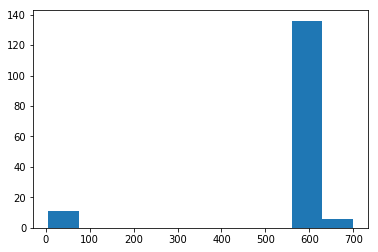

In [786]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f369b940>,
 'caps': [<matplotlib.lines.Line2D at 0x202f36a3048>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f369b7f0>],
 'medians': [<matplotlib.lines.Line2D at 0x202f36a36d8>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f36a3a20>],
 'means': []}

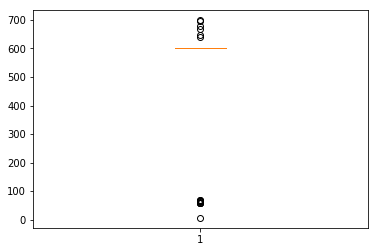

In [787]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [792]:
OFFICE_SUPPLIES_6_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 100]
OFFICE_SUPPLIES_6_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,11.00,12507.64,1630.27,11214.00,11419.00,11624.00,13154.00,15434.00
JNL,11.00,129.09,77.29,26.00,66.00,101.00,186.50,255.00
CHECK #,10.00,421906.00,2158.03,419302.00,420159.25,421405.00,423241.50,425261.00
JOURNAL AMOUNT,11.00,58.27,17.63,6.09,60.00,62.00,65.73,69.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,11.00,6921.91,13078.01,65.14,1350.00,1714.71,4332.49,44686.71
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,1388.88,nan,1388.88,1388.88,1388.88,1388.88,1388.88
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [793]:
OFFICE_SUPPLIES_6_outliers_b = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 600]
OFFICE_SUPPLIES_6_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,6.00,11710.67,331.88,11384.00,11454.00,11609.00,12019.00,12104.00
JNL,6.00,180.67,121.44,48.00,83.00,179.00,242.75,363.00
CHECK #,6.00,422589.17,2890.49,419336.00,420175.50,422436.00,424857.75,426240.00
JOURNAL AMOUNT,6.00,671.51,24.59,638.55,653.18,674.23,691.24,699.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,6.00,9167.31,12957.62,-71.83,708.72,3364.58,12415.99,33089.96
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,720.00,nan,720.00,720.00,720.00,720.00,720.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


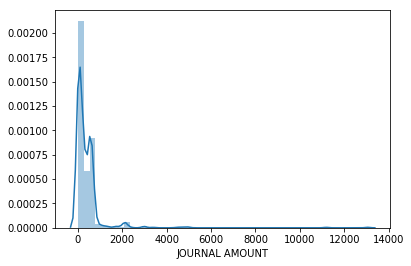

In [790]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'OFFICE SUPPLIES']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../office_supplies_journal_amounts.png')

In [791]:
dept['JOURNAL AMOUNT'].describe()

count     777.00
mean      381.56
std       794.01
min         1.25
25%        49.98
50%       195.00
75%       584.13
max     13054.92
Name: JOURNAL AMOUNT, dtype: float64

### `TUITION TO NON PUBLIC SCHOOLS`

#### `first_digit` = 5

In [794]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39988,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,026654,20175150,173025,420405.00,B,5085.00,nan,5085.00,nan,4047559.79,nan,5
40016,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,028390,20175420,173068,420320.00,B,5263.94,nan,190578.69,nan,nan,nan,5
40017,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002939,20175408,173069,420319.00,B,5318.75,nan,195897.44,nan,nan,nan,5
40042,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,012079,20175392,173342,420517.00,B,5458.61,nan,322932.63,nan,nan,nan,5
40068,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173310,420431.00,B,5013.60,nan,486169.68,nan,nan,nan,5
40069,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173311,420431.00,B,5013.60,nan,491183.28,nan,nan,nan,5
40070,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173312,420431.00,B,5013.60,nan,496196.88,nan,nan,nan,5
40071,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173313,420431.00,B,5013.60,nan,501210.48,nan,nan,nan,5
40072,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173314,420431.00,B,5013.60,nan,506224.08,nan,nan,nan,5
40112,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,313,2016-10-24,API,014730,20175430,174720,421113.00,B,5952.89,nan,736430.28,nan,nan,nan,5


In [795]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     89.00
mean    5293.42
std      945.75
min      520.00
25%     5134.35
50%     5455.65
75%     5703.90
max     5961.76
Name: JOURNAL AMOUNT, dtype: float64

In [796]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5590.00    6
5559.48    5
5013.60    5
5445.60    5
5952.89    4
5018.76    3
5134.35    3
5134.10    3
5259.60    3
5529.30    3
520.00     3
5318.75    2
5703.90    2
5879.96    2
5535.92    2
5882.80    2
5326.04    2
5869.50    2
5012.96    2
5961.76    2
5263.94    2
5310.50    2
5306.76    2
5870.10    1
5175.30    1
5035.94    1
5573.40    1
5844.00    1
5224.91    1
5750.93    1
5868.25    1
5462.60    1
5014.65    1
5577.50    1
5458.61    1
5683.27    1
5455.65    1
5042.40    1
5761.50    1
5074.35    1
5819.00    1
5761.80    1
5868.94    1
5727.00    1
5085.00    1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 3.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 36., 50.]),
 array([ 520.   , 1064.176, 1608.352, 2152.528, 2696.704, 3240.88 ,
        3785.056, 4329.232, 4873.408, 5417.584, 5961.76 ]),
 <a list of 10 Patch objects>)

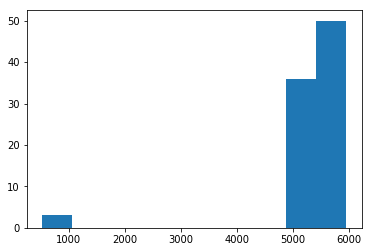

In [797]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f3f8f9e8>,
 'caps': [<matplotlib.lines.Line2D at 0x202f3f880f0>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f3f8f898>],
 'medians': [<matplotlib.lines.Line2D at 0x202f3f886a0>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f3f889e8>],
 'means': []}

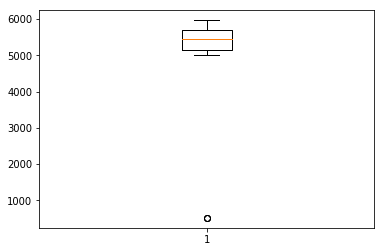

In [798]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [800]:
TUITION_TO_NON_PUBLIC_SCHOOLS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_5_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,3.00,390902.00,0.00,390902.00,390902.00,390902.00,390902.00,390902.00
JNL,3.00,569.00,0.00,569.00,569.00,569.00,569.00,569.00
CHECK #,3.00,427230.00,0.00,427230.00,427230.00,427230.00,427230.00,427230.00
JOURNAL AMOUNT,3.00,520.00,0.00,520.00,520.00,520.00,520.00,520.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,3.00,3149605.93,723.81,3148955.93,3149215.93,3149475.93,3149930.93,3150385.93
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 6

In [801]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
40024,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,000388,20175409,173394,420522.00,B,66.31,nan,245525.63,nan,nan,nan,6
40044,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,012079,20175392,173351,420517.00,B,6894.51,nan,329926.94,nan,nan,nan,6
40048,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,011377,20175393,173357,420586.00,B,6571.72,nan,352032.06,nan,nan,nan,6
40049,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,011377,20175393,173361,420586.00,B,6917.60,nan,358949.66,nan,nan,nan,6
40052,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,001122,20175406,173371,420587.00,B,6809.03,nan,385631.93,nan,nan,nan,6
40055,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,000870,20175407,173376,420505.00,B,6086.60,nan,399094.19,nan,nan,nan,6
40056,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,000870,20175407,173377,420505.00,B,6086.60,nan,405180.79,nan,nan,nan,6
40061,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,000376,20175432,173297,420427.00,B,6419.52,nan,427095.51,nan,nan,nan,6
40062,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,000376,20175432,173299,420427.00,B,6419.52,nan,433515.03,nan,nan,nan,6
40083,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173325,420431.00,B,6466.65,nan,536973.48,nan,nan,nan,6


In [802]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    104.00
mean    6402.05
std      885.97
min       66.31
25%     6284.47
50%     6466.65
75%     6714.15
max     6972.84
Name: JOURNAL AMOUNT, dtype: float64

In [803]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

6466.65    15
6807.00     5
6266.20     5
6126.30     4
6767.70     4
6571.72     3
6273.45     3
6579.51     3
6910.49     3
6714.15     3
6691.68     3
6633.45     3
6464.42     3
6387.60     2
6177.20     2
6617.59     2
6086.60     2
6486.06     2
6585.46     2
6191.22     2
6609.09     2
6892.82     2
6149.00     2
6723.20     2
6917.60     2
6419.52     2
6954.48     1
6765.80     1
6559.42     1
6546.78     1
6427.51     1
6686.20     1
6183.07     1
6894.51     1
6225.84     1
6376.62     1
6940.05     1
66.31       1
6351.89     1
6303.00     1
6288.15     1
6136.20     1
6720.60     1
6809.03     1
6017.58     1
6972.84     1
643.50      1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 24., 78.]),
 array([  66.31 ,  756.963, 1447.616, 2138.269, 2828.922, 3519.575,
        4210.228, 4900.881, 5591.534, 6282.187, 6972.84 ]),
 <a list of 10 Patch objects>)

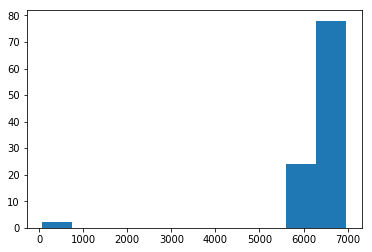

In [804]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f3c75748>,
 'caps': [<matplotlib.lines.Line2D at 0x202f3c75e48>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f3c755f8>],
 'medians': [<matplotlib.lines.Line2D at 0x202f3c6f518>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f3c6f860>],
 'means': []}

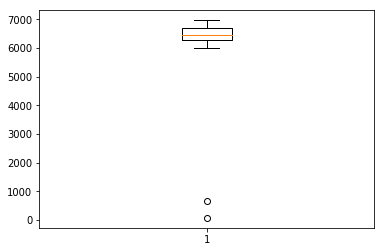

In [805]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [807]:
TUITION_TO_NON_PUBLIC_SCHOOLS_6_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_6_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,2.00,390902.00,0.00,390902.00,390902.00,390902.00,390902.00,390902.00
JNL,2.00,162.50,212.84,12.00,87.25,162.50,237.75,313.00
CHECK #,2.00,420854.50,470.23,420522.00,420688.25,420854.50,421020.75,421187.00
JOURNAL AMOUNT,2.00,354.90,408.13,66.31,210.61,354.90,499.20,643.50
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,2.00,517991.57,385325.03,245525.63,381758.60,517991.57,654224.54,790457.51
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 7

In [808]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
40004,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,026707,20175399,173044,420336.00,B,7269.76,nan,82433.78,nan,nan,nan,7
40013,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173058,420322.00,B,7785.60,nan,168575.94,nan,nan,nan,7
40014,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173059,420322.00,B,7785.60,nan,176361.54,nan,nan,nan,7
40032,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175411,173412,420574.00,B,77.70,nan,264212.74,nan,nan,nan,7
40035,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,014730,20175430,173332,420454.00,B,7206.49,nan,276885.33,nan,nan,nan,7
40036,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,010107,20175429,173333,420457.00,B,7266.16,nan,284151.49,nan,nan,nan,7
40039,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,002915,20175422,173336,420483.00,B,7791.46,nan,298985.22,nan,nan,nan,7
40046,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,022935,20175395,173339,420489.00,B,7703.70,nan,337756.64,nan,nan,nan,7
40047,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,022935,20175395,173340,420489.00,B,7703.70,nan,345460.34,nan,nan,nan,7
40054,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,001122,20175406,173375,420587.00,B,7274.20,nan,393007.59,nan,nan,nan,7


In [809]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    104.00
mean    7490.12
std      786.35
min       77.70
25%     7297.30
50%     7565.45
75%     7828.05
max     7983.80
Name: JOURNAL AMOUNT, dtype: float64

In [810]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

7828.05    9
7224.94    6
7360.22    6
7785.40    6
7147.35    5
7899.00    5
7396.13    4
7983.80    3
7504.05    3
7274.20    3
7946.37    3
7962.00    2
7964.99    2
7563.90    2
7747.60    2
7605.20    2
7109.91    2
7527.93    2
7703.70    2
7126.57    2
7321.72    2
7785.60    2
7266.16    1
7075.68    1
7269.76    1
7670.10    1
7946.50    1
7791.46    1
7609.36    1
7528.14    1
7660.50    1
7780.67    1
7489.44    1
7912.00    1
7866.00    1
7263.48    1
7725.38    1
7682.00    1
77.70      1
7038.00    1
7689.13    1
7207.75    1
7206.49    1
7442.38    1
7567.00    1
7325.50    1
7636.00    1
7354.82    1
7402.72    1
7728.06    1
7305.00    1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 11., 92.]),
 array([  77.7 ,  868.31, 1658.92, 2449.53, 3240.14, 4030.75, 4821.36,
        5611.97, 6402.58, 7193.19, 7983.8 ]),
 <a list of 10 Patch objects>)

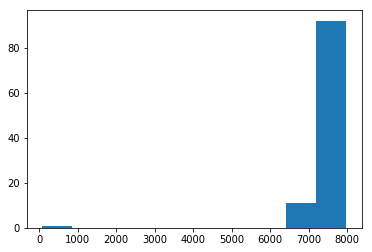

In [811]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f43452e8>,
 'caps': [<matplotlib.lines.Line2D at 0x202f43459b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f4345198>],
 'medians': [<matplotlib.lines.Line2D at 0x202f4322080>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f43223c8>],
 'means': []}

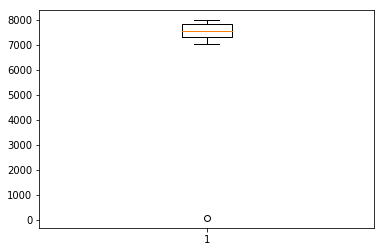

In [812]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [813]:
TUITION_TO_NON_PUBLIC_SCHOOLS_7_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_7_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,390902.00,nan,390902.00,390902.00,390902.00,390902.00,390902.00
JNL,1.00,12.00,nan,12.00,12.00,12.00,12.00,12.00
CHECK #,1.00,420574.00,nan,420574.00,420574.00,420574.00,420574.00,420574.00
JOURNAL AMOUNT,1.00,77.70,nan,77.70,77.70,77.70,77.70,77.70
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,264212.74,nan,264212.74,264212.74,264212.74,264212.74,264212.74
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 8

In [814]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '8'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39995,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173035,420397.00,B,838.50,nan,22553.30,nan,nan,nan,8
39996,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173036,420397.00,B,838.50,nan,23391.80,nan,nan,nan,8
40015,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173067,420322.00,B,8953.21,nan,185314.75,nan,nan,nan,8
40022,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173061,420322.00,B,8953.21,nan,241832.41,nan,nan,nan,8
40028,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173406,420573.00,B,80.75,nan,258923.35,nan,nan,nan,8
40029,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173408,420573.00,B,80.75,nan,259004.10,nan,nan,nan,8
40030,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173409,420573.00,B,884.60,nan,259888.70,nan,nan,nan,8
40095,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,103,2016-10-11,API,005676,20175414,173815,420828.00,B,8745.98,nan,612280.31,nan,nan,nan,8
40096,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,103,2016-10-11,API,005676,20175414,173816,420828.00,B,8745.98,nan,621026.29,nan,nan,nan,8
40097,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,103,2016-10-11,API,005676,20175414,173817,420828.00,B,8745.98,nan,629772.27,nan,nan,nan,8


In [815]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     92.00
mean    8160.25
std     1858.83
min       80.75
25%     8319.62
50%     8609.48
75%     8844.60
max     8953.21
Name: JOURNAL AMOUNT, dtype: float64

In [816]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

8890.66    6
8293.95    6
8745.98    5
8563.94    5
8364.60    5
8947.20    4
8953.21    4
8782.83    3
8844.60    3
8688.90    3
8937.61    3
8942.64    2
8164.17    2
8649.30    2
8824.20    2
8033.52    2
8516.80    2
838.50     2
8199.90    2
8360.10    2
8404.00    2
8794.80    2
8174.67    2
8609.48    2
80.75      2
8384.20    1
8001.62    1
8072.68    1
8606.59    1
8790.73    1
884.60     1
8917.13    1
8692.78    1
8746.56    1
8402.37    1
8024.40    1
8134.80    1
8328.18    1
8885.94    1
8533.00    1
8510.00    1
8797.94    1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 5.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  4., 83.]),
 array([  80.75 ,  967.996, 1855.242, 2742.488, 3629.734, 4516.98 ,
        5404.226, 6291.472, 7178.718, 8065.964, 8953.21 ]),
 <a list of 10 Patch objects>)

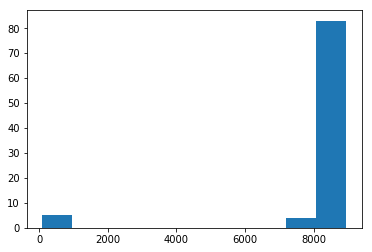

In [817]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f435cfd0>,
 'caps': [<matplotlib.lines.Line2D at 0x202f438c6d8>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f435ce80>],
 'medians': [<matplotlib.lines.Line2D at 0x202f438cd68>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f4389080>],
 'means': []}

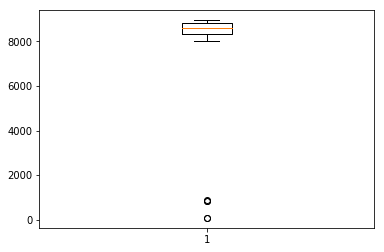

In [818]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [819]:
TUITION_TO_NON_PUBLIC_SCHOOLS_8_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 2_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_8_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,5.00,390902.00,0.00,390902.00,390902.00,390902.00,390902.00,390902.00
JNL,5.00,166.80,211.97,12.00,12.00,12.00,399.00,399.00
CHECK #,5.00,420502.60,96.40,420397.00,420397.00,420573.00,420573.00,420573.00
JOURNAL AMOUNT,5.00,544.62,423.87,80.75,80.75,838.50,838.50,884.60
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,5.00,164752.25,129427.46,22553.30,23391.80,258923.35,259004.10,259888.70
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 9

In [820]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '9'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39998,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,019951,20175401,173038,420373.00,B,9662.94,nan,43254.51,nan,nan,nan,9
40007,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,026707,20175399,173055,420336.00,B,9716.07,nan,102924.22,nan,nan,nan,9
40018,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173070,420316.00,B,9079.28,nan,204976.72,nan,nan,nan,9
40019,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173074,420316.00,B,9079.28,nan,214056.00,nan,nan,nan,9
40020,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173075,420316.00,B,9411.60,nan,223467.60,nan,nan,nan,9
40021,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173076,420316.00,B,9411.60,nan,232879.20,nan,nan,nan,9
40040,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,002915,20175422,173337,420483.00,B,9244.40,nan,308229.62,nan,nan,nan,9
40041,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,002915,20175422,173338,420483.00,B,9244.40,nan,317474.02,nan,nan,nan,9
40043,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,012079,20175392,173346,420517.00,B,99.80,nan,323032.43,nan,nan,nan,9
40050,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,028302,20175396,173367,420500.00,B,9936.62,nan,368886.28,nan,nan,nan,9


In [821]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     59.00
mean    9179.80
std     1661.42
min       99.80
25%     9245.44
50%     9413.64
75%     9715.76
max     9936.62
Name: JOURNAL AMOUNT, dtype: float64

In [822]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

9936.62    7
9245.44    6
9737.10    4
9423.00    4
9201.06    3
9253.40    3
9286.83    2
9204.12    2
9413.64    2
9368.48    2
9520.65    2
9079.28    2
9729.06    2
9244.40    2
9411.60    2
9664.60    2
9662.94    1
9931.06    1
9629.28    1
9487.50    1
9716.07    1
9222.62    1
9641.83    1
9715.46    1
9094.32    1
99.80      1
9619.13    1
910.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 57.]),
 array([  99.8  , 1083.482, 2067.164, 3050.846, 4034.528, 5018.21 ,
        6001.892, 6985.574, 7969.256, 8952.938, 9936.62 ]),
 <a list of 10 Patch objects>)

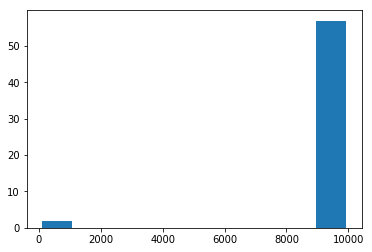

In [823]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f54baf28>,
 'caps': [<matplotlib.lines.Line2D at 0x202f54ad5f8>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f54badd8>],
 'medians': [<matplotlib.lines.Line2D at 0x202f54adc88>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f54adfd0>],
 'means': []}

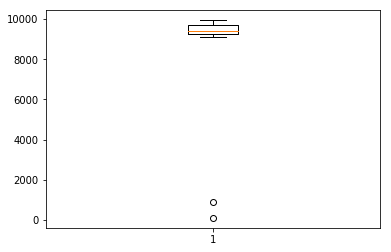

In [824]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [825]:
TUITION_TO_NON_PUBLIC_SCHOOLS_9_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 2_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_9_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,2.00,390902.00,0.00,390902.00,390902.00,390902.00,390902.00,390902.00
JNL,2.00,162.00,207.89,15.00,88.50,162.00,235.50,309.00
CHECK #,2.00,423386.50,4058.09,420517.00,421951.75,423386.50,424821.25,426256.00
JOURNAL AMOUNT,2.00,504.90,572.90,99.80,302.35,504.90,707.45,910.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,2.00,1288285.84,1365074.46,323032.43,805659.14,1288285.84,1770912.54,2253539.25
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


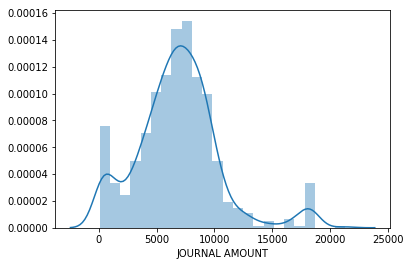

In [521]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'TUITION TO NON PUBLIC SCHOOLS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../tuition_to_non_public_schools_journal_amounts.png')

In [522]:
dept['JOURNAL AMOUNT'].describe()

count     702.00
mean     6843.22
std      3651.10
min        66.31
25%      4751.50
50%      6744.50
75%      8745.98
max     21343.06
Name: JOURNAL AMOUNT, dtype: float64

### `TAX TITLE`

#### `first_digit` = 7

In [826]:
dept = 'TAX TITLE'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
22826,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169309,418514.00,NaN,75.00,nan,-111.58,nan,nan,nan,7
22827,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169310,418515.00,NaN,75.00,nan,-36.58,nan,nan,nan,7
22828,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169312,418516.00,B,75.00,nan,38.42,nan,nan,nan,7
22829,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169313,418517.00,B,75.00,nan,113.42,nan,nan,nan,7
22830,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169314,418518.00,B,75.00,nan,188.42,nan,nan,nan,7
22831,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169343,418519.00,B,75.00,nan,263.42,nan,nan,nan,7
22834,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,57,2016-07-19,API,000503,NaN,169564,418666.00,NaN,75.00,nan,-6750.33,nan,nan,nan,7
22835,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,57,2016-07-19,API,000503,NaN,169566,418667.00,NaN,75.00,nan,-6675.33,nan,nan,nan,7
22838,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,152,2016-07-28,API,000503,NaN,170124,418798.00,NaN,75.00,nan,-6914.33,nan,nan,nan,7
22839,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,152,2016-07-28,API,000503,NaN,170131,418799.00,NaN,75.00,nan,-6839.33,nan,nan,nan,7


In [827]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   368.00
mean     76.83
std      35.19
min      75.00
25%      75.00
50%      75.00
75%      75.00
max     750.00
Name: JOURNAL AMOUNT, dtype: float64

In [828]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

75.00     367
750.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([367.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([ 75. , 142.5, 210. , 277.5, 345. , 412.5, 480. , 547.5, 615. ,
        682.5, 750. ]),
 <a list of 10 Patch objects>)

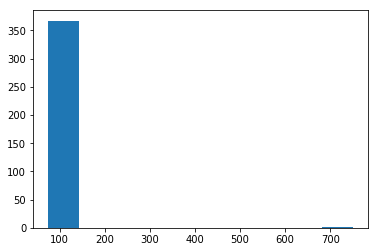

In [829]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f56f3278>,
 'caps': [<matplotlib.lines.Line2D at 0x202f56f3940>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f56f3128>],
 'medians': [<matplotlib.lines.Line2D at 0x202f56f3fd0>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f570a358>],
 'means': []}

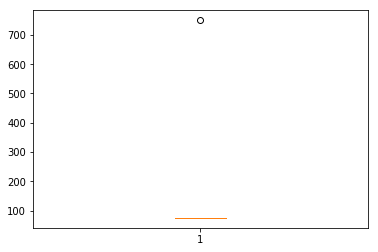

In [830]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [831]:
TAX_TITLE_7_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 700]
TAX_TITLE_7_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,11457.00,nan,11457.00,11457.00,11457.00,11457.00,11457.00
JNL,1.00,255.00,nan,255.00,255.00,255.00,255.00,255.00
CHECK #,1.00,420860.00,nan,420860.00,420860.00,420860.00,420860.00,420860.00
JOURNAL AMOUNT,1.00,750.00,nan,750.00,750.00,750.00,750.00,750.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,112875.65,nan,112875.65,112875.65,112875.65,112875.65,112875.65
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


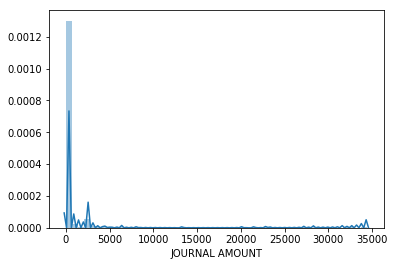

In [529]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'TAX TITLE']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../tax_title_journal_amounts.png')

In [530]:
dept['JOURNAL AMOUNT'].describe()

count     544.00
mean      943.86
std      4055.33
min         3.00
25%        75.00
50%        75.00
75%       375.00
max     34409.52
Name: JOURNAL AMOUNT, dtype: float64

### `BUILDING SECRETARIES`

#### `first_digit` = 4

In [832]:
dept = 'BUILDING SECRETARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
33759,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,4739.53,nan,4739.53,nan,251537.52,nan,4
33760,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,4739.53,nan,9479.06,nan,nan,nan,4
33761,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,4739.53,nan,14218.59,nan,nan,nan,4
33762,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,4739.53,nan,18958.12,nan,nan,nan,4
33763,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,4739.53,nan,23697.65,nan,nan,nan,4
33764,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,4739.53,nan,28437.18,nan,nan,nan,4
33765,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,4739.53,nan,33176.71,nan,nan,nan,4
33766,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,4739.53,nan,37916.24,nan,nan,nan,4
33767,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,4771.07,nan,42687.31,nan,nan,nan,4
33768,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,4762.61,nan,47449.92,nan,nan,nan,4


In [833]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     53.00
mean    4765.09
std       27.62
min     4651.29
25%     4747.23
50%     4771.07
75%     4779.79
max     4837.26
Name: JOURNAL AMOUNT, dtype: float64

In [834]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4747.23    15
4779.79    13
4791.33    10
4739.53     8
4762.61     2
4793.53     1
4771.07     1
4837.26     1
4651.29     1
4795.95     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 1.,  0.,  0.,  0.,  8., 17., 14., 12.,  0.,  1.]),
 array([4651.29 , 4669.887, 4688.484, 4707.081, 4725.678, 4744.275,
        4762.872, 4781.469, 4800.066, 4818.663, 4837.26 ]),
 <a list of 10 Patch objects>)

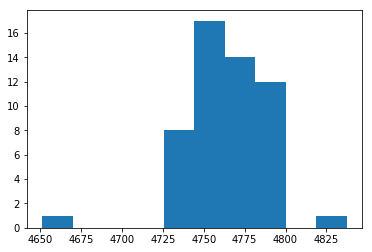

In [835]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f5b2e630>,
 'caps': [<matplotlib.lines.Line2D at 0x202f5b2ecc0>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f5b2e4e0>],
 'medians': [<matplotlib.lines.Line2D at 0x202f5b214a8>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f5b217f0>],
 'means': []}

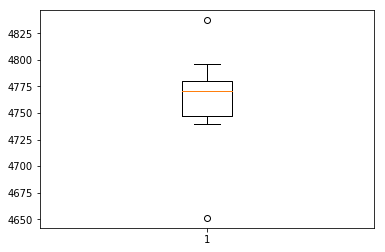

In [836]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [838]:
BUILDING_SECRETARIES_4_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 4_675)]
BUILDING_SECRETARIES_4_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,320708.00,nan,320708.00,320708.00,320708.00,320708.00,320708.00
JNL,1.00,506.00,nan,506.00,506.00,506.00,506.00,506.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,1.00,4651.29,nan,4651.29,4651.29,4651.29,4651.29,4651.29
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,176503.87,nan,176503.87,176503.87,176503.87,176503.87,176503.87
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [840]:
BUILDING_SECRETARIES_4_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 4_800)]
BUILDING_SECRETARIES_4_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,320708.00,nan,320708.00,320708.00,320708.00,320708.00,320708.00
JNL,1.00,610.00,nan,610.00,610.00,610.00,610.00,610.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,1.00,4837.26,nan,4837.26,4837.26,4837.26,4837.26,4837.26
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,252549.58,nan,252549.58,252549.58,252549.58,252549.58,252549.58
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 8

In [841]:
dept = 'BUILDING SECRETARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '8'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
19336,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,813.23,nan,813.23,nan,46057.96,nan,8
19337,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,813.23,nan,1626.46,nan,nan,nan,8
19338,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,813.23,nan,2439.69,nan,nan,nan,8
19339,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,813.23,nan,3252.92,nan,nan,nan,8
19340,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,813.23,nan,4066.15,nan,nan,nan,8
19341,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,813.23,nan,4879.38,nan,nan,nan,8
19342,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,813.23,nan,5692.61,nan,nan,nan,8
19343,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,813.23,nan,6505.84,nan,nan,nan,8
19344,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,813.23,nan,7319.07,nan,nan,nan,8
19345,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,813.23,nan,8132.30,nan,nan,nan,8


In [842]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   262.00
mean    861.40
std      29.23
min     813.23
25%     857.63
50%     868.57
75%     885.75
max     886.35
Name: JOURNAL AMOUNT, dtype: float64

In [843]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

885.75    72
813.23    64
886.35    44
857.63    39
868.57    32
874.81     8
874.79     1
866.43     1
885.73     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 64.,   0.,   0.,   0.,   0.,   0.,  39.,  33.,   9., 117.]),
 array([813.23 , 820.542, 827.854, 835.166, 842.478, 849.79 , 857.102,
        864.414, 871.726, 879.038, 886.35 ]),
 <a list of 10 Patch objects>)

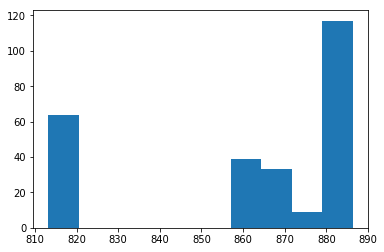

In [844]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f6db20b8>,
 'caps': [<matplotlib.lines.Line2D at 0x202f6db2710>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f681df28>],
 'medians': [<matplotlib.lines.Line2D at 0x202f6db2da0>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f6db9128>],
 'means': []}

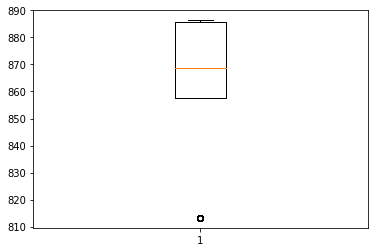

In [845]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [846]:
BUILDING_SECRETARIES_8_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 820]
BUILDING_SECRETARIES_8_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,64.00,320495.50,341.57,320308.00,320308.00,320308.00,320308.00,321108.00
JNL,64.00,305.00,119.15,114.00,206.00,294.00,427.50,512.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,64.00,813.23,0.00,813.23,813.23,813.23,813.23,813.23
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,64.00,17090.54,11859.85,813.23,7115.76,14231.52,27039.90,39848.27
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,47636.85,2232.88,46057.96,46847.40,47636.85,48426.29,49215.73
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 9

In [847]:
dept = 'BUILDING SECRETARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '9'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18894,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,928.81,nan,928.81,nan,50378.12,nan,9
18895,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,928.81,nan,1857.62,nan,nan,nan,9
18896,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,928.81,nan,2786.43,nan,nan,nan,9
18897,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,928.81,nan,3715.24,nan,nan,nan,9
18898,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,928.81,nan,4644.05,nan,nan,nan,9
18899,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,928.81,nan,5572.86,nan,nan,nan,9
18900,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,928.81,nan,6501.67,nan,nan,nan,9
18901,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,928.81,nan,7430.48,nan,nan,nan,9
18902,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,928.81,nan,8359.29,nan,nan,nan,9
18903,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,928.81,nan,9288.10,nan,nan,nan,9


In [848]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   266.00
mean    946.37
std      18.69
min     903.25
25%     930.16
50%     939.77
75%     951.31
max     978.24
Name: JOURNAL AMOUNT, dtype: float64

In [849]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

951.31    67
978.24    52
939.77    52
930.16    42
928.81    36
918.62     9
903.25     2
968.81     2
947.66     1
903.85     1
957.27     1
937.08     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 3.,  0.,  9., 78., 53.,  1., 67.,  1.,  2., 52.]),
 array([903.25 , 910.749, 918.248, 925.747, 933.246, 940.745, 948.244,
        955.743, 963.242, 970.741, 978.24 ]),
 <a list of 10 Patch objects>)

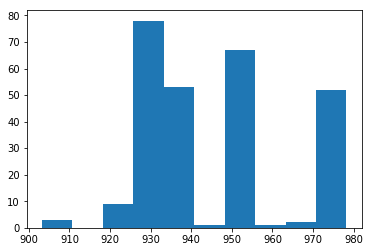

In [850]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f69d9198>,
 'caps': [<matplotlib.lines.Line2D at 0x202f69d9828>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f69d9048>],
 'medians': [<matplotlib.lines.Line2D at 0x202f69d9eb8>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f69bc240>],
 'means': []}

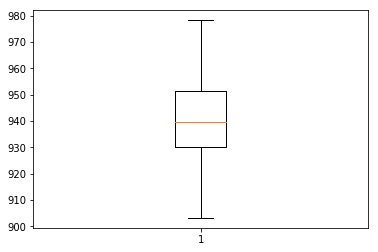

In [851]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [852]:
BUILDING_SECRETARIES_9_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 910]
BUILDING_SECRETARIES_9_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
19740,321008,01 -000-300-001-70-00-522102-,01,000,300,001,70,00,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,903.85,nan,46901.73,nan,nan,nan,9
31924,320108,01 -300-320-000-08-01-522102-,01,300,320,000,08,01,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,903.25,nan,46412.49,nan,nan,nan,9
32916,320408,01 -300-320-000-08-04-522102-,01,300,320,000,08,04,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,903.25,nan,46962.25,nan,nan,nan,9


In [853]:
BUILDING_SECRETARIES_9_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 940) & (first_digit_checks['JOURNAL AMOUNT'] < 950)]
BUILDING_SECRETARIES_9_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
33213,320508,01 -300-320-000-08-05-522102-,01,300,320,000,08,05,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,947.66,nan,49219.04,nan,nan,nan,9


In [854]:
BUILDING_SECRETARIES_9_outliers_c = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 950) & (first_digit_checks['JOURNAL AMOUNT'] < 970)]
BUILDING_SECRETARIES_9_outliers_c

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18931,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 9,509,2017-03-24,PRJ,SCHOOL,1170326,1170326,nan,NaN,951.31,nan,35820.20,nan,nan,nan,9
18932,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 9,512,2017-03-31,PRJ,SCHOOL,1170333,1170333,nan,NaN,951.31,nan,36771.51,nan,nan,nan,9
18933,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,215,2017-04-07,PRJ,SCHOOL,1170406,1170406,nan,NaN,951.31,nan,37722.82,nan,nan,nan,9
18934,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,427,2017-04-14,PRJ,SCHOOL,1170415,1170415,nan,NaN,951.31,nan,38674.13,nan,nan,nan,9
18935,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,430,2017-04-21,PRJ,SCHOOL,1170422,1170422,nan,NaN,951.31,nan,39625.44,nan,nan,nan,9
18936,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,433,2017-04-28,PRJ,SCHOOL,1170429,1170429,nan,NaN,951.31,nan,40576.75,nan,nan,nan,9
18937,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,352,2017-05-05,PRJ,170505,1170505,1170505,nan,NaN,951.31,nan,41528.06,nan,nan,nan,9
18938,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,475,2017-05-12,PRJ,170513,1170513,1170513,nan,NaN,951.31,nan,42479.37,nan,nan,nan,9
18939,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,478,2017-05-19,PRJ,170520,1170520,1170520,nan,NaN,951.31,nan,43430.68,nan,nan,nan,9
18940,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,481,2017-05-26,PRJ,170528,1170528,1170528,nan,NaN,951.31,nan,44381.99,nan,nan,nan,9


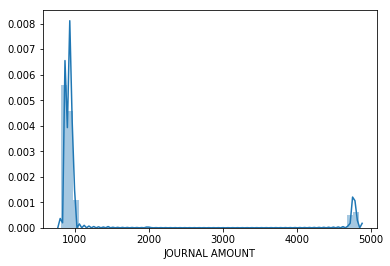

In [855]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'BUILDING SECRETARIES']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../building_secretaries_journal_amounts.png')

In [856]:
dept['JOURNAL AMOUNT'].describe()

count    583.00
mean    1257.96
std     1112.13
min      813.23
25%      885.74
50%      928.81
75%      951.31
max     4837.26
Name: JOURNAL AMOUNT, dtype: float64

### `ATHLETIC SUPPLIES & MATS`

#### `first_digit` = 5

In [857]:
dept = 'ATHLETIC SUPPLIES & MATS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
37058,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 1,6,2016-07-06,API,019041,20166716,168961,nan,NaN,50.00,nan,248.00,nan,nan,nan,5
37103,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,004638,20175029,173686,420645.00,NaN,58.00,nan,29338.80,nan,nan,nan,5
37104,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,018244,20175029,173697,420778.00,NaN,58.00,nan,29396.80,nan,nan,nan,5
37107,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,022853,20175029,173691,420725.00,NaN,58.00,nan,29614.80,nan,nan,nan,5
37108,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,023874,20175029,173692,420731.00,NaN,58.00,nan,29672.80,nan,nan,nan,5
37109,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,023874,20175029,173693,420731.00,NaN,58.00,nan,29730.80,nan,nan,nan,5
37111,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,024854,20175029,173694,420747.00,NaN,58.00,nan,29868.80,nan,nan,nan,5
37112,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,027525,20175029,173687,420655.00,NaN,58.00,nan,29926.80,nan,nan,nan,5
37113,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,027592,20175029,173690,420712.00,NaN,58.00,nan,29984.80,nan,nan,nan,5
37116,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,028423,20175029,173696,420765.00,NaN,58.00,nan,30202.80,nan,nan,nan,5


In [858]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     89.00
mean     149.65
std      629.63
min       50.00
25%       58.00
50%       58.00
75%       58.00
max     5934.00
Name: JOURNAL AMOUNT, dtype: float64

In [859]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

58.00      73
50.00       8
55.00       2
528.00      2
5934.00     1
529.52      1
503.00      1
552.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([88.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  50. ,  638.4, 1226.8, 1815.2, 2403.6, 2992. , 3580.4, 4168.8,
        4757.2, 5345.6, 5934. ]),
 <a list of 10 Patch objects>)

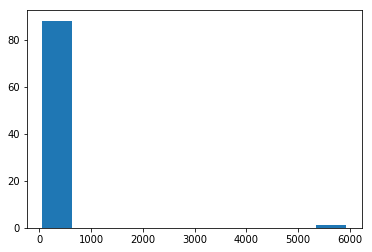

In [860]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f71e9358>,
 'caps': [<matplotlib.lines.Line2D at 0x202f71e9a20>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f71e9208>],
 'medians': [<matplotlib.lines.Line2D at 0x202f720f0f0>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f720f400>],
 'means': []}

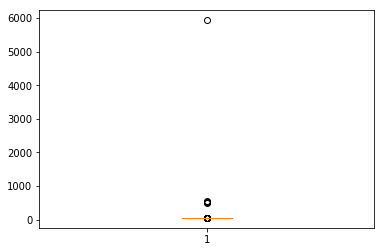

In [861]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [862]:
ATHLETIC_SUPPLIES_MATS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 5_000]
ATHLETIC_SUPPLIES_MATS_5_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,330908.00,nan,330908.00,330908.00,330908.00,330908.00,330908.00
JNL,1.00,414.00,nan,414.00,414.00,414.00,414.00,414.00
CHECK #,1.00,423831.00,nan,423831.00,423831.00,423831.00,423831.00,423831.00
JOURNAL AMOUNT,1.00,5934.00,nan,5934.00,5934.00,5934.00,5934.00,5934.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,106975.41,nan,106975.41,106975.41,106975.41,106975.41,106975.41
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 7

In [863]:
dept = 'ATHLETIC SUPPLIES & MATS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
37057,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 1,6,2016-07-06,API,019041,20166634,168960,nan,NaN,73.00,nan,198.00,nan,nan,nan,7
37072,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,383,2016-09-29,API,021755,20175036,172879,420392.00,NaN,7249.00,nan,22391.00,nan,nan,nan,7
37075,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,483,2016-09-30,GEN,FY2017,SCH/POL,PO175028,nan,NaN,704.00,nan,26594.00,nan,nan,nan,7
37117,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,91,2016-10-11,API,001008,20175348,173789,420813.00,NaN,75.00,nan,30277.80,nan,nan,nan,7
37149,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,178,2016-10-17,API,002111,20175029,174234,420932.00,NaN,73.00,nan,41608.75,nan,nan,nan,7
37165,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,219,2016-10-18,API,001008,20175348,174358,420997.00,NaN,75.00,nan,45675.75,nan,nan,nan,7
37170,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 5,43,2016-11-02,API,001008,20175348,175232,421423.00,NaN,75.00,nan,50194.60,nan,nan,nan,7
37241,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 5,190,2016-11-15,API,001008,20175348,175997,421760.00,NaN,75.00,nan,59613.12,nan,nan,nan,7
37242,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 5,190,2016-11-15,API,001008,20175348,175998,421760.00,NaN,75.00,nan,59688.12,nan,nan,nan,7
37265,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 6,97,2016-12-07,API,018816,20175029,176999,422263.00,NaN,73.00,nan,67169.76,nan,nan,nan,7


In [864]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     62.00
mean     212.15
std      915.70
min       70.00
25%       75.00
50%       75.00
75%       77.25
max     7249.00
Name: JOURNAL AMOUNT, dtype: float64

In [865]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

75.00      41
78.00      12
73.00       4
7249.00     1
70.00       1
748.00      1
79.00       1
704.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([61.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  70. ,  787.9, 1505.8, 2223.7, 2941.6, 3659.5, 4377.4, 5095.3,
        5813.2, 6531.1, 7249. ]),
 <a list of 10 Patch objects>)

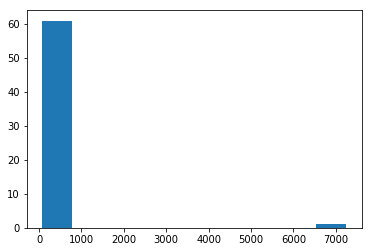

In [866]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f8516b00>,
 'caps': [<matplotlib.lines.Line2D at 0x202f8529208>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f85169b0>],
 'medians': [<matplotlib.lines.Line2D at 0x202f8529898>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f8529be0>],
 'means': []}

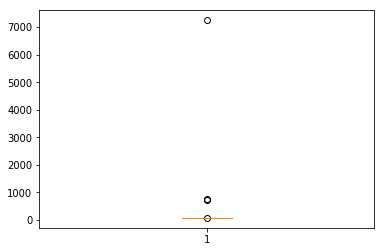

In [867]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [868]:
ATHLETIC_SUPPLIES_MATS_7_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 6_000]
ATHLETIC_SUPPLIES_MATS_7_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,330908.00,nan,330908.00,330908.00,330908.00,330908.00,330908.00
JNL,1.00,383.00,nan,383.00,383.00,383.00,383.00,383.00
CHECK #,1.00,420392.00,nan,420392.00,420392.00,420392.00,420392.00,420392.00
JOURNAL AMOUNT,1.00,7249.00,nan,7249.00,7249.00,7249.00,7249.00,7249.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,22391.00,nan,22391.00,22391.00,22391.00,22391.00,22391.00
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 8

In [565]:
dept = 'ATHLETIC SUPPLIES & MATS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '8'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
37079,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,018385,20175029,173491,420527.00,NaN,80.00,nan,27012.00,nan,nan,nan,8
37080,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021753,20175029,173484,420518.00,NaN,87.00,nan,27099.00,nan,nan,nan,8
37081,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,023531,20175029,173485,420495.00,NaN,87.00,nan,27186.00,nan,nan,nan,8
37086,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,027525,20175029,173489,420451.00,NaN,80.00,nan,27668.00,nan,nan,nan,8
37090,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,018219,20175029,173501,420559.00,NaN,87.00,nan,28163.00,nan,nan,nan,8
37091,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,018938,20175029,173499,420512.00,NaN,87.00,nan,28250.00,nan,nan,nan,8
37092,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021276,20175029,173503,420570.00,NaN,87.00,nan,28337.00,nan,nan,nan,8
37093,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021672,20175029,173504,420579.00,NaN,87.00,nan,28424.00,nan,nan,nan,8
37094,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021717,20175029,173498,420471.00,NaN,87.00,nan,28511.00,nan,nan,nan,8
37095,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,022534,20175029,173496,420417.00,NaN,87.00,nan,28598.00,nan,nan,nan,8


In [566]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    197.00
mean     135.50
std      594.87
min       80.00
25%       80.00
50%       80.00
75%       85.00
max     8334.00
Name: JOURNAL AMOUNT, dtype: float64

In [567]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

80.00      145
87.00       41
88.00        4
85.00        3
845.26       1
8334.00      1
880.00       1
860.00       1
Name: JOURNAL AMOUNT, dtype: int64

(array([196.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([  80. ,  905.4, 1730.8, 2556.2, 3381.6, 4207. , 5032.4, 5857.8,
        6683.2, 7508.6, 8334. ]),
 <a list of 10 Patch objects>)

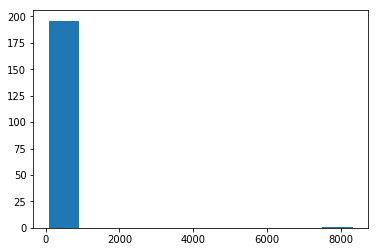

In [568]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f7061dd8>,
 'caps': [<matplotlib.lines.Line2D at 0x202f70784e0>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f7061c88>],
 'medians': [<matplotlib.lines.Line2D at 0x202f7078b70>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f7078eb8>],
 'means': []}

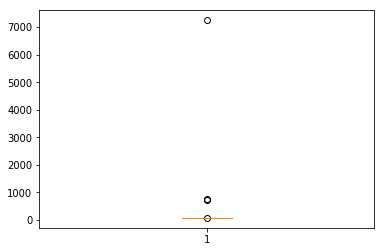

In [869]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [871]:
ATHLETIC_SUPPLIES_MATS_8_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 7_000]
ATHLETIC_SUPPLIES_MATS_8_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,330908.00,nan,330908.00,330908.00,330908.00,330908.00,330908.00
JNL,1.00,383.00,nan,383.00,383.00,383.00,383.00,383.00
CHECK #,1.00,420392.00,nan,420392.00,420392.00,420392.00,420392.00,420392.00
JOURNAL AMOUNT,1.00,7249.00,nan,7249.00,7249.00,7249.00,7249.00,7249.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,22391.00,nan,22391.00,22391.00,22391.00,22391.00,22391.00
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


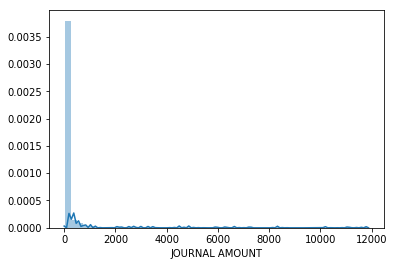

In [872]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'ATHLETIC SUPPLIES & MATS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../athletic_supplies_mats_journal_amounts.png')

In [873]:
dept['JOURNAL AMOUNT'].describe()

count     531.00
mean      306.24
std      1134.14
min        25.00
25%        75.00
50%        80.00
75%       116.00
max     11852.00
Name: JOURNAL AMOUNT, dtype: float64

### `TUITION TO MASS SCHOOLS`

#### `first_digit` = 4

In [874]:
dept = 'TUITION TO MASS SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39447,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173240,420577.00,NaN,4527.20,nan,4527.20,nan,3753518.04,nan,4
39448,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173241,420577.00,NaN,4527.20,nan,9054.40,nan,nan,nan,4
39449,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173242,420577.00,NaN,4527.20,nan,13581.60,nan,nan,nan,4
39450,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173243,420577.00,NaN,4527.20,nan,18108.80,nan,nan,nan,4
39457,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173250,420577.00,NaN,4952.00,nan,60408.88,nan,nan,nan,4
39458,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173251,420577.00,NaN,4952.00,nan,65360.88,nan,nan,nan,4
39462,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175248,173255,420577.00,NaN,4527.20,nan,90315.74,nan,nan,nan,4
39465,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173258,420577.00,NaN,4527.20,nan,105839.76,nan,nan,nan,4
39466,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173259,420577.00,NaN,4527.20,nan,110366.96,nan,nan,nan,4
39467,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173260,420577.00,NaN,4527.20,nan,114894.16,nan,nan,nan,4


In [875]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    115.00
mean    4534.27
std      227.09
min     4023.63
25%     4333.14
50%     4527.20
75%     4642.65
max     4983.00
Name: JOURNAL AMOUNT, dtype: float64

In [876]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4642.65    23
4333.14    23
4809.98    12
4244.10    11
4527.20    10
4952.00     5
4593.16     4
4616.26     3
4669.38     2
4928.79     2
4523.86     2
4384.38     2
4175.60     2
4409.97     2
4983.00     1
4196.60     1
4858.14     1
4645.50     1
4112.60     1
4405.41     1
4890.00     1
4926.30     1
4395.46     1
4401.00     1
4318.23     1
4023.63     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2.,  3., 11., 29.,  2., 16., 29.,  0., 13., 10.]),
 array([4023.63 , 4119.567, 4215.504, 4311.441, 4407.378, 4503.315,
        4599.252, 4695.189, 4791.126, 4887.063, 4983.   ]),
 <a list of 10 Patch objects>)

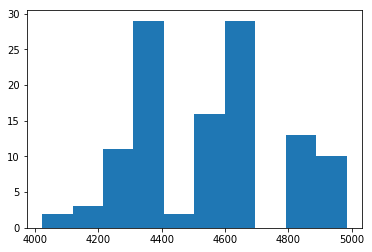

In [877]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f6d6cf28>,
 'caps': [<matplotlib.lines.Line2D at 0x202f6d7e6d8>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f6d6ccf8>],
 'medians': [<matplotlib.lines.Line2D at 0x202f6c49208>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f6c495c0>],
 'means': []}

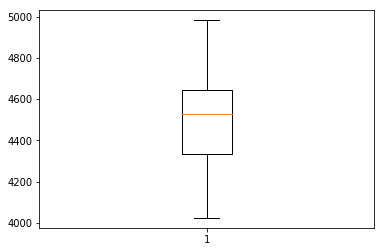

In [878]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [879]:
TUITION_TO_MASS_SCHOOLS_4_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 4_000) & (first_digit_checks['JOURNAL AMOUNT'] < 4_200)]
TUITION_TO_MASS_SCHOOLS_4_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39561,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175249,175618,421599.00,NaN,4196.60,nan,686043.90,nan,nan,nan,4
39672,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175698,180390,423718.00,NaN,4112.60,nan,1335373.09,nan,nan,nan,4
39674,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175699,180392,423718.00,NaN,4175.60,nan,1348393.89,nan,nan,nan,4
39675,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175699,180393,423718.00,NaN,4175.60,nan,1352569.49,nan,nan,nan,4
39777,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/10,110,2017-04-10,API,007792,20175244,183488,425379.00,NaN,4023.63,nan,1920595.98,nan,nan,nan,4


In [880]:
TUITION_TO_MASS_SCHOOLS_4_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 4_400) & (first_digit_checks['JOURNAL AMOUNT'] < 4_500)]
TUITION_TO_MASS_SCHOOLS_4_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39619,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,001712,20175697,178673,422967.00,NaN,4409.97,nan,1036357.92,nan,nan,nan,4
39620,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,001712,20175697,178674,422967.00,NaN,4409.97,nan,1040767.89,nan,nan,nan,4
39626,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,023568,20175403,178680,423002.00,NaN,4401.00,nan,1070875.27,nan,nan,nan,4
39761,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 9,355,2017-03-23,API,023216,20175660,182514,424688.00,NaN,4405.41,nan,1821508.69,nan,nan,nan,4


#### `first_digit` = 5

In [881]:
dept = 'TUITION TO MASS SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39475,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,12,2016-10-06,API,023568,20175403,173391,420590.00,NaN,5925.00,nan,163804.76,nan,nan,nan,5
39483,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,001712,20175254,173208,420542.00,NaN,5757.64,nan,213155.34,nan,nan,nan,5
39520,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,320,2016-10-25,API,001712,20175697,174745,421203.00,NaN,5447.61,nan,447527.95,nan,nan,nan,5
39521,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,320,2016-10-25,API,001712,20175697,174746,421203.00,NaN,5447.61,nan,452975.56,nan,nan,nan,5
39549,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175606,421599.00,NaN,5658.80,nan,618006.30,nan,nan,nan,5
39550,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175607,421599.00,NaN,5658.80,nan,623665.10,nan,nan,nan,5
39551,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175608,421599.00,NaN,5658.80,nan,629323.90,nan,nan,nan,5
39552,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175609,421599.00,NaN,5658.80,nan,634982.70,nan,nan,nan,5
39553,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175610,421599.00,NaN,5658.80,nan,640641.50,nan,nan,nan,5
39554,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175611,421599.00,NaN,5658.80,nan,646300.30,nan,nan,nan,5


In [882]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     93.00
mean    5400.42
std      554.29
min      565.88
25%     5261.67
50%     5571.18
75%     5658.80
max     5925.00
Name: JOURNAL AMOUNT, dtype: float64

In [883]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5658.80    24
5571.18    20
5261.67    20
5092.92    13
5707.02     4
5447.61     2
5188.20     2
5193.40     1
5760.96     1
565.88      1
5360.28     1
5757.64     1
5593.28     1
5307.12     1
5925.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 38., 54.]),
 array([ 565.88 , 1101.792, 1637.704, 2173.616, 2709.528, 3245.44 ,
        3781.352, 4317.264, 4853.176, 5389.088, 5925.   ]),
 <a list of 10 Patch objects>)

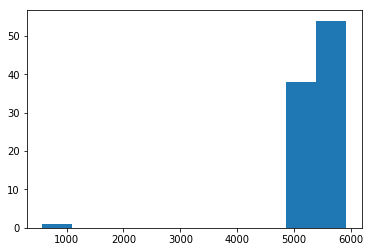

In [884]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f395c1d0>,
 'caps': [<matplotlib.lines.Line2D at 0x202f6fcb470>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f395c080>],
 'medians': [<matplotlib.lines.Line2D at 0x202f6fcb3c8>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f6fcb0f0>],
 'means': []}

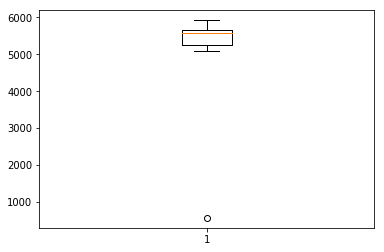

In [885]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [886]:
TUITION_TO_MASS_SCHOOLS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 2_000]
TUITION_TO_MASS_SCHOOLS_5_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,390902.00,nan,390902.00,390902.00,390902.00,390902.00,390902.00
JNL,1.00,41.00,nan,41.00,41.00,41.00,41.00,41.00
CHECK #,1.00,426670.00,nan,426670.00,426670.00,426670.00,426670.00,426670.00
JOURNAL AMOUNT,1.00,565.88,nan,565.88,565.88,565.88,565.88,565.88
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,2308427.99,nan,2308427.99,2308427.99,2308427.99,2308427.99,2308427.99
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 6

In [887]:
dept = 'TUITION TO MASS SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39451,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173244,420577.00,NaN,6224.68,nan,24333.48,nan,nan,nan,6
39452,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173245,420577.00,NaN,6224.68,nan,30558.16,nan,nan,nan,6
39453,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173246,420577.00,NaN,6224.68,nan,36782.84,nan,nan,nan,6
39454,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173247,420577.00,NaN,6224.68,nan,43007.52,nan,nan,nan,6
39455,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173248,420577.00,NaN,6224.68,nan,49232.20,nan,nan,nan,6
39456,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173249,420577.00,NaN,6224.68,nan,55456.88,nan,nan,nan,6
39459,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173252,420577.00,NaN,6809.22,nan,72170.10,nan,nan,nan,6
39460,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173253,420577.00,NaN,6809.22,nan,78979.32,nan,nan,nan,6
39461,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173254,420577.00,NaN,6809.22,nan,85788.54,nan,nan,nan,6
39469,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173262,420577.00,NaN,6224.68,nan,125646.04,nan,nan,nan,6


In [888]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    163.00
mean    6448.22
std      296.67
min     6099.84
25%     6190.20
50%     6224.68
75%     6809.22
max     6898.78
Name: JOURNAL AMOUNT, dtype: float64

In [889]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

6809.22    61
6190.20    41
6224.68    36
6190.00    12
6099.84     2
6225.84     2
6191.64     1
6700.35     1
6246.10     1
6633.90     1
6253.66     1
6898.78     1
6777.60     1
6438.72     1
6738.50     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2., 94.,  0.,  0.,  1.,  0.,  1.,  2., 62.,  1.]),
 array([6099.84 , 6179.734, 6259.628, 6339.522, 6419.416, 6499.31 ,
        6579.204, 6659.098, 6738.992, 6818.886, 6898.78 ]),
 <a list of 10 Patch objects>)

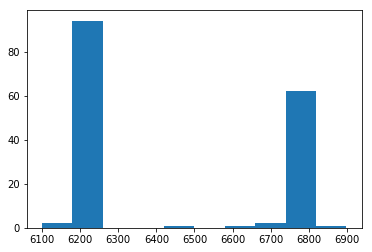

In [890]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f39f9278>,
 'caps': [<matplotlib.lines.Line2D at 0x202f39f9908>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f39f9128>],
 'medians': [<matplotlib.lines.Line2D at 0x202f39f9f98>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f39d3320>],
 'means': []}

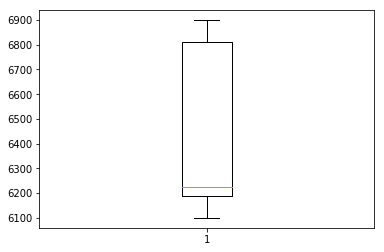

In [891]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [892]:
TUITION_TO_MASS_SCHOOLS_6_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 6_200]
TUITION_TO_MASS_SCHOOLS_6_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39488,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173213,420577.00,NaN,6190.00,nan,256687.62,nan,nan,nan,6
39489,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173214,420577.00,NaN,6190.00,nan,262877.62,nan,nan,nan,6
39490,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173215,420577.00,NaN,6190.00,nan,269067.62,nan,nan,nan,6
39491,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173216,420577.00,NaN,6190.00,nan,275257.62,nan,nan,nan,6
39492,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173217,420577.00,NaN,6190.00,nan,281447.62,nan,nan,nan,6
39493,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173218,420577.00,NaN,6190.00,nan,287637.62,nan,nan,nan,6
39494,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173219,420577.00,NaN,6190.00,nan,293827.62,nan,nan,nan,6
39495,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173220,420577.00,NaN,6190.00,nan,300017.62,nan,nan,nan,6
39496,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173221,420577.00,NaN,6190.00,nan,306207.62,nan,nan,nan,6
39497,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173222,420577.00,NaN,6190.00,nan,312397.62,nan,nan,nan,6


In [893]:
TUITION_TO_MASS_SCHOOLS_6_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 6_400) & (first_digit_checks['JOURNAL AMOUNT'] < 6_500)]
TUITION_TO_MASS_SCHOOLS_6_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39527,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,320,2016-10-25,API,023216,20175660,174757,421103.00,NaN,6438.72,nan,491169.22,nan,nan,nan,6


In [894]:
TUITION_TO_MASS_SCHOOLS_6_outliers_c = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 6_600) & (first_digit_checks['JOURNAL AMOUNT'] < 6_800)]
TUITION_TO_MASS_SCHOOLS_6_outliers_c

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39617,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 6,263,2016-12-19,API,023568,20175403,177583,422596.00,NaN,6738.50,nan,999019.95,nan,nan,nan,6
39668,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,023216,20175660,180386,423618.00,NaN,6777.60,nan,1311950.29,nan,nan,nan,6
39719,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 9,240,2017-03-15,API,001712,20175698,182088,424611.00,NaN,6700.35,nan,1634073.97,nan,nan,nan,6
39720,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 9,240,2017-03-15,API,001712,20175698,182089,424611.00,NaN,6633.90,nan,1640707.87,nan,nan,nan,6


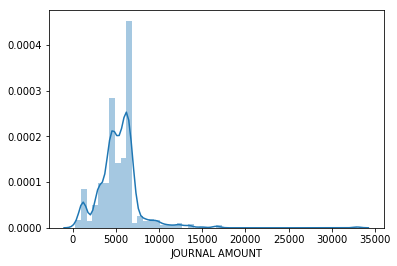

In [895]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'TUITION TO MASS SCHOOLS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../tuition_to_mass_schools_journal_amounts.png')

In [896]:
dept['JOURNAL AMOUNT'].describe()

count     541.00
mean     5346.03
std      2498.54
min       309.51
25%      4244.10
50%      5261.67
75%      6224.68
max     32928.00
Name: JOURNAL AMOUNT, dtype: float64

### `SPED OUTSIDE TRANSPORTATION`

#### `first_digit` = 2

In [897]:
dept = 'SPED OUTSIDE TRANSPORTATION'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '2'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
35504,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023212,20165635,171895,419695.00,NaN,2030.00,nan,8965.00,nan,nan,nan,2
35508,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023572,20165733,171902,419787.00,NaN,2235.00,nan,15620.00,nan,nan,nan,2
35509,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,019685,20166635,171907,419784.00,NaN,2730.00,nan,18350.00,nan,nan,nan,2
35510,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,019685,20166635,171910,419784.00,NaN,2600.00,nan,20950.00,nan,nan,nan,2
35513,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,023212,20175170,172520,420031.00,NaN,2900.00,nan,29710.00,nan,nan,nan,2
35515,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,019401,20175087,172523,420098.00,NaN,240.00,nan,30675.00,nan,nan,nan,2
35517,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,002602,20175234,173057,420229.00,NaN,267.00,nan,35844.00,nan,nan,nan,2
35523,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,022165,20175342,173066,420318.00,NaN,2775.00,nan,51755.00,nan,nan,nan,2
35525,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,019685,20175169,173072,nan,NaN,2860.00,nan,56565.00,nan,nan,nan,2
35527,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,023212,20175163,173510,420419.00,NaN,2185.00,nan,57550.00,nan,nan,nan,2


In [898]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    157.00
mean    2359.13
std      612.89
min      205.00
25%     2212.00
50%     2500.00
75%     2730.00
max     2975.00
Name: JOURNAL AMOUNT, dtype: float64

In [899]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

2900.00    8
2730.00    6
2600.00    6
2700.00    5
2640.00    5
2030.00    4
2500.00    4
2465.00    4
2100.00    4
2520.00    4
2000.00    4
2400.00    4
2720.00    3
2805.00    3
2775.00    3
2145.00    3
2340.00    3
2755.00    2
2185.00    2
250.00     2
2160.00    2
2210.00    2
2590.00    2
2475.00    2
2860.00    2
2080.00    2
2844.00    2
2240.00    2
2850.00    2
2880.00    2
2310.00    2
2375.00    2
2300.00    2
2686.00    2
2470.00    2
2610.00    2
2565.00    2
2212.00    2
2415.00    2
269.10     1
2090.00    1
2560.00    1
2835.00    1
2795.00    1
2175.00    1
2050.00    1
270.00     1
2070.00    1
2970.00    1
290.00     1
2580.00    1
2394.00    1
2838.00    1
2200.00    1
220.00     1
267.00     1
240.00     1
2790.00    1
2040.00    1
2800.00    1
242.19     1
2235.00    1
2450.00    1
2244.00    1
2550.00    1
2295.00    1
2250.00    1
2430.00    1
2420.00    1
2535.00    1
2280.00    1
2365.00    1
2940.00    1
2750.00    1
2904.00    1
2376.00    1
2975.00    1

(array([10.,  0.,  0.,  0.,  0.,  0., 18., 40., 41., 48.]),
 array([ 205.,  482.,  759., 1036., 1313., 1590., 1867., 2144., 2421.,
        2698., 2975.]),
 <a list of 10 Patch objects>)

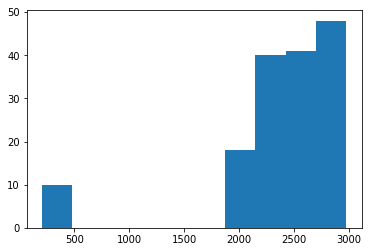

In [900]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f86accf8>,
 'caps': [<matplotlib.lines.Line2D at 0x202f8f65400>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f86acba8>],
 'medians': [<matplotlib.lines.Line2D at 0x202f8f65a90>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f8f65dd8>],
 'means': []}

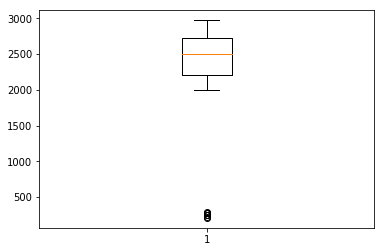

In [901]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [902]:
SPED_OUTSIDE_TRANSPORTATION_2_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 500]
SPED_OUTSIDE_TRANSPORTATION_2_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,10.00,330902.00,0.00,330902.00,330902.00,330902.00,330902.00,330902.00
JNL,10.00,172.10,130.31,41.00,88.00,91.00,290.75,406.00
CHECK #,10.00,421554.10,1453.70,420098.00,420608.50,421332.50,421998.50,425132.00
JOURNAL AMOUNT,10.00,250.33,25.25,205.00,240.55,250.00,268.58,290.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,10.00,255714.16,265707.22,30675.00,82206.75,211613.50,309352.89,940715.13
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 3

In [903]:
dept = 'SPED OUTSIDE TRANSPORTATION'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '3'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
35502,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023212,20165545,171891,419695.00,NaN,3710.00,nan,3710.00,nan,2596789.78,nan,3
35503,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023212,20165339,171892,419695.00,NaN,3225.00,nan,6935.00,nan,nan,nan,3
35511,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,023212,20175164,172518,420031.00,NaN,3960.00,nan,24910.00,nan,nan,nan,3
35534,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,022165,20175342,173518,420510.00,NaN,3145.00,nan,70970.00,nan,nan,nan,3
35535,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,015438,20175083,173519,420543.00,NaN,3325.00,nan,74295.00,nan,nan,nan,3
35544,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,000932,20175166,173918,420769.00,NaN,3325.00,nan,97980.00,nan,nan,nan,3
35549,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,000932,20175165,173923,420769.00,NaN,3040.00,nan,108785.00,nan,nan,nan,3
35551,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175180,173925,420774.00,NaN,300.00,nan,111485.00,nan,nan,nan,3
35552,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175176,173926,420774.00,NaN,300.00,nan,111785.00,nan,nan,nan,3
35561,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175174,173935,420774.00,NaN,3600.00,nan,125820.00,nan,nan,nan,3


In [904]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    103.00
mean    3302.34
std      582.90
min      300.00
25%     3160.00
50%     3318.00
75%     3517.50
max     3990.00
Name: JOURNAL AMOUNT, dtype: float64

In [905]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

3300.00    8
3465.00    5
3000.00    5
3318.00    4
3040.00    4
3160.00    4
3330.00    4
3045.00    3
3500.00    3
3780.00    3
3600.00    3
3700.00    3
3960.00    3
3325.00    3
3515.00    3
3895.00    3
3476.00    2
3240.00    2
3288.00    2
3204.00    2
3420.00    2
3225.00    2
3675.00    2
3870.00    2
3145.00    2
3510.00    2
300.00     2
3150.00    2
3280.00    1
3060.00    1
3135.00    1
3096.00    1
380.00     1
3120.00    1
3520.00    1
3900.00    1
3200.00    1
3705.00    1
3080.00    1
3267.00    1
3315.00    1
3570.00    1
3655.00    1
3990.00    1
3075.00    1
3710.00    1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 3.,  0.,  0.,  0.,  0.,  0.,  0., 33., 46., 21.]),
 array([ 300.,  669., 1038., 1407., 1776., 2145., 2514., 2883., 3252.,
        3621., 3990.]),
 <a list of 10 Patch objects>)

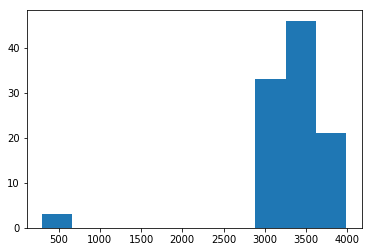

In [906]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f8776780>,
 'caps': [<matplotlib.lines.Line2D at 0x202f8776e48>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f8776630>],
 'medians': [<matplotlib.lines.Line2D at 0x202f879c518>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f879c860>],
 'means': []}

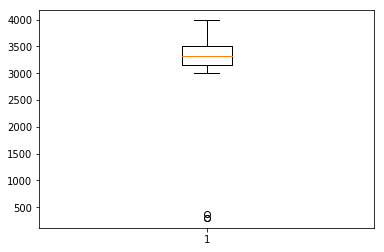

In [907]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [911]:
SPED_OUTSIDE_TRANSPORTATION_3_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
SPED_OUTSIDE_TRANSPORTATION_3_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,3.00,330902.00,0.00,330902.00,330902.00,330902.00,330902.00,330902.00
JNL,3.00,115.67,28.29,83.00,107.50,132.00,132.00,132.00
CHECK #,3.00,421968.67,2069.22,420774.00,420774.00,420774.00,422566.00,424358.00
JOURNAL AMOUNT,3.00,326.67,46.19,300.00,300.00,300.00,340.00,380.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,3.00,341865.93,398771.70,111485.00,111635.00,111785.00,457056.40,802327.79
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


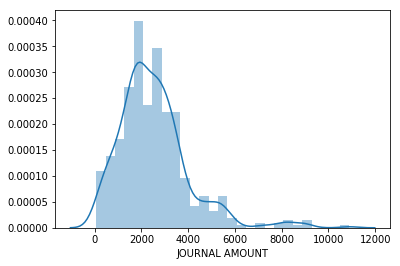

In [909]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'SPED OUTSIDE TRANSPORTATION']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../sped_outside_transportation_journal_amounts.png')

In [910]:
dept['JOURNAL AMOUNT'].describe()

count     525.00
mean     2526.08
std      1527.54
min        60.00
25%      1567.50
50%      2340.00
75%      3204.00
max     10880.00
Name: JOURNAL AMOUNT, dtype: float64

### `ASSISTANT PRINCIPALS`

#### `first_digit` = 2

In [912]:
dept = 'ASSISTANT PRINCIPALS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '2'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
31925,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,2021.83,nan,2021.83,nan,106912.00,nan,2
31926,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,2021.83,nan,4043.66,nan,nan,nan,2
31927,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,2021.83,nan,6065.49,nan,nan,nan,2
31928,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,2021.83,nan,8087.32,nan,nan,nan,2
31929,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,2021.83,nan,10109.15,nan,nan,nan,2
31930,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,2021.83,nan,12130.98,nan,nan,nan,2
31931,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,2021.83,nan,14152.81,nan,nan,nan,2
31932,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,2021.83,nan,16174.64,nan,nan,nan,2
31933,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,2021.83,nan,18196.47,nan,nan,nan,2
31934,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,2021.83,nan,20218.30,nan,nan,nan,2


In [913]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    318.00
mean    2045.47
std       47.57
min     2008.13
25%     2021.83
50%     2031.09
75%     2042.96
max     2300.88
Name: JOURNAL AMOUNT, dtype: float64

In [914]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

2042.96    88
2021.83    88
2008.13    44
2031.09    44
2100.65    44
2255.77     9
2300.88     1
Name: JOURNAL AMOUNT, dtype: int64

(array([176.,  88.,   0.,  44.,   0.,   0.,   0.,   0.,   9.,   1.]),
 array([2008.13 , 2037.405, 2066.68 , 2095.955, 2125.23 , 2154.505,
        2183.78 , 2213.055, 2242.33 , 2271.605, 2300.88 ]),
 <a list of 10 Patch objects>)

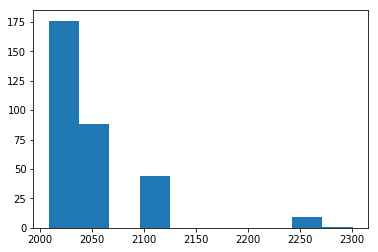

In [915]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f9394160>,
 'caps': [<matplotlib.lines.Line2D at 0x202f93947f0>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f93a3fd0>],
 'medians': [<matplotlib.lines.Line2D at 0x202f9394e80>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f93a1208>],
 'means': []}

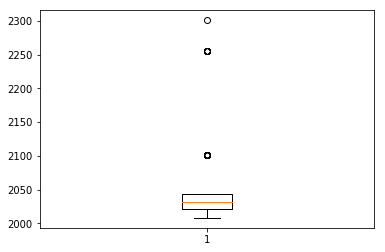

In [916]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [918]:
ASSISTANT_PRINCIPALS_2_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 2_200)]
ASSISTANT_PRINCIPALS_2_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,10.00,320708.00,0.00,320708.00,320708.00,320708.00,320708.00,320708.00
JNL,10.00,271.00,177.65,114.00,173.75,180.50,389.50,610.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,10.00,2260.28,14.27,2255.77,2255.77,2255.77,2255.77,2300.88
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,10.00,153335.10,233560.69,2255.77,7331.25,12406.74,328755.09,519706.84
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,518993.53,nan,518993.53,518993.53,518993.53,518993.53,518993.53
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 4

In [919]:
dept = 'ASSISTANT PRINCIPALS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18947,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,4087.65,nan,4087.65,nan,216074.56,nan,4
18948,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,4087.65,nan,8175.30,nan,nan,nan,4
18949,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,4087.65,nan,12262.95,nan,nan,nan,4
18950,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,4087.65,nan,16350.60,nan,nan,nan,4
18951,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,4087.65,nan,20438.25,nan,nan,nan,4
18952,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,4087.65,nan,24525.90,nan,nan,nan,4
18953,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,4087.65,nan,28613.55,nan,nan,nan,4
18954,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,4087.65,nan,32701.20,nan,nan,nan,4
18955,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,4087.65,nan,36788.85,nan,nan,nan,4
18956,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,4087.65,nan,40876.50,nan,nan,nan,4


In [920]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    132.00
mean    4119.58
std       38.91
min     4087.65
25%     4087.65
50%     4096.96
75%     4174.13
max     4174.13
Name: JOURNAL AMOUNT, dtype: float64

In [921]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4174.13    44
4087.65    44
4096.96    44
Name: JOURNAL AMOUNT, dtype: int64

(array([44., 44.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 44.]),
 array([4087.65 , 4096.298, 4104.946, 4113.594, 4122.242, 4130.89 ,
        4139.538, 4148.186, 4156.834, 4165.482, 4174.13 ]),
 <a list of 10 Patch objects>)

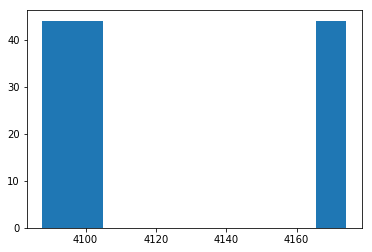

In [922]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x202f93160b8>,
 'caps': [<matplotlib.lines.Line2D at 0x202f9316710>,
 'boxes': [<matplotlib.lines.Line2D at 0x202f92fbf28>],
 'medians': [<matplotlib.lines.Line2D at 0x202f9316da0>],
 'fliers': [<matplotlib.lines.Line2D at 0x202f92f7128>],
 'means': []}

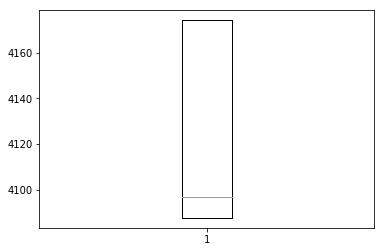

In [923]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [924]:
ASSISTANT_PRINCIPALS_4_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 4_160]
ASSISTANT_PRINCIPALS_4_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
19741,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,4174.13,nan,4174.13,nan,213824.00,nan,4
19742,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,4174.13,nan,8348.26,nan,nan,nan,4
19743,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,4174.13,nan,12522.39,nan,nan,nan,4
19744,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,4174.13,nan,16696.52,nan,nan,nan,4
19745,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,4174.13,nan,20870.65,nan,nan,nan,4
19746,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,4174.13,nan,25044.78,nan,nan,nan,4
19747,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,4174.13,nan,29218.91,nan,nan,nan,4
19748,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,4174.13,nan,33393.04,nan,nan,nan,4
19749,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,4174.13,nan,37567.17,nan,nan,nan,4
19750,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,4174.13,nan,41741.30,nan,nan,nan,4


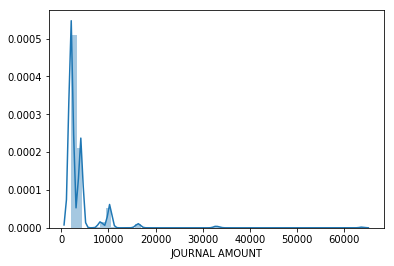

In [925]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'ASSISTANT PRINCIPALS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../assistant_principals_journal_amounts.png')

In [926]:
dept['JOURNAL AMOUNT'].describe()

count     505.00
mean     3771.52
std      4426.15
min      2008.13
25%      2021.83
50%      2042.96
75%      4096.96
max     63732.59
Name: JOURNAL AMOUNT, dtype: float64

## Merge all Benford's Law Outliers

In [624]:
benfords_law_outliers = pd.concat([CLASSROOM_TEACHERS_3_outliers,
                                   CLASSROOM_TEACHERS_4_outliers,
                                   CLASSROOM_TEACHERS_5_outliers,
                                   CLASSROOM_TEACHERS_6_outliers_a,
                                   CLASSROOM_TEACHERS_6_outliers_b,
                                   CLASSROOM_TEACHERS_7_outliers,
                                   ADDITIONAL_DIFFERENTIAL_3_outliers_a,
                                   ADDITIONAL_DIFFERENTIAL_3_outliers_b,
                                   OFFICE_SUPPLIES_5_outliers_a,
                                   OFFICE_SUPPLIES_5_outliers_b,
                                   OFFICE_SUPPLIES_6_outliers_a,
                                   OFFICE_SUPPLIES_6_outliers_b,
                                   TUITION_TO_NON_PUBLIC_SCHOOLS_5_outliers,
                                   TUITION_TO_NON_PUBLIC_SCHOOLS_6_outliers,
                                   TUITION_TO_NON_PUBLIC_SCHOOLS_7_outliers,
                                   TUITION_TO_NON_PUBLIC_SCHOOLS_8_outliers,
                                   TUITION_TO_NON_PUBLIC_SCHOOLS_9_outliers,
                                   TAX_TITLE_7_outliers,
                                   BUILDING_SECRETARIES_4_outliers,
                                   BUILDING_SECRETARIES_8_outliers,
                                   BUILDING_SECRETARIES_9_outliers_a,
                                   BUILDING_SECRETARIES_9_outliers_b,
                                   BUILDING_SECRETARIES_9_outliers_c,
                                   ATHLETIC_SUPPLIES_MATS_5_outliers,
                                   ATHLETIC_SUPPLIES_MATS_7_outliers,
                                   ATHLETIC_SUPPLIES_MATS_8_outliers,
                                   TUITION_TO_MASS_SCHOOLS_4_outliers_a,
                                   TUITION_TO_MASS_SCHOOLS_4_outliers_b,
                                   TUITION_TO_MASS_SCHOOLS_5_outliers,
                                   TUITION_TO_MASS_SCHOOLS_6_outliers_a,
                                   TUITION_TO_MASS_SCHOOLS_6_outliers_b,
                                   TUITION_TO_MASS_SCHOOLS_6_outliers_c,
                                   SPED_OUTSIDE_TRANSPORTATION_2_outliers,
                                   SPED_OUTSIDE_TRANSPORTATION_3_outliers,
                                   ASSISTANT_PRINCIPALS_2_outliers,
                                   ASSISTANT_PRINCIPALS_4_outliers])

# Prepare data for Model

## Filter for large accounts

In [625]:
num_of_exp_by_account_desc = expenditures['ACCOUNT DESC'].value_counts()
num_of_exp_by_account_desc

PERMANENT SALARIES                2671
EDUCATIONAL INCENTIVE             1106
REVOLVING ACCOUNT EXPENSES        1024
CLASSROOM TEACHERS                1003
PURCHASE OF SERVICES               957
ADDITIONAL DIFFERENTIAL            859
OFFICE SUPPLIES                    777
TUITION TO NON PUBLIC SCHOOLS      702
MAINTENANCE OF BUILDINGS           617
BUILDING SECRETARIES               583
PRINCIPALS                         583
BUILDING MAINTENANCE & REPAIR      548
TAX TITLE                          544
TUITION TO MASS SCHOOLS            541
ATHLETIC SUPPLIES & MATS           531
SPED OUTSIDE TRANSPORTATION        525
ASSISTANT PRINCIPALS               505
INSTRUCTIONAL MATERIALS            504
SPED 504 SERVICES                  498
SUBSTITUTES                        477
SOCIAL WORKERS                     405
MEDICAL EXPENSES                   378
BUILDING TECHNOLOGISTS             370
SPECIALIST TEACHERS                358
MAINTENANCE OF EQUIPMENT           357
TUITION TO COLLABORATIVES

In [626]:
mask = num_of_exp_by_account_desc >= 500
num_of_exp_by_account_desc[mask]

PERMANENT SALARIES               2671
EDUCATIONAL INCENTIVE            1106
REVOLVING ACCOUNT EXPENSES       1024
CLASSROOM TEACHERS               1003
PURCHASE OF SERVICES              957
ADDITIONAL DIFFERENTIAL           859
OFFICE SUPPLIES                   777
TUITION TO NON PUBLIC SCHOOLS     702
MAINTENANCE OF BUILDINGS          617
BUILDING SECRETARIES              583
PRINCIPALS                        583
BUILDING MAINTENANCE & REPAIR     548
TAX TITLE                         544
TUITION TO MASS SCHOOLS           541
ATHLETIC SUPPLIES & MATS          531
SPED OUTSIDE TRANSPORTATION       525
ASSISTANT PRINCIPALS              505
INSTRUCTIONAL MATERIALS           504
Name: ACCOUNT DESC, dtype: int64

In [627]:
large_accounts = (expenditures['ACCOUNT DESC'].value_counts() >= 500).index[:18].tolist()

In [628]:
mask = expenditures['ACCOUNT DESC'].isin(large_accounts)
large_depts =expenditures[mask]

In [629]:
expenditures_model = large_depts

##  Change `seg3` and `seg7` to integers.

In [630]:
expenditures_model = large_depts.astype({"seg3": int, "seg7": int})

## pd.get_dummies `ACCOUNT DESC`

In [631]:
expenditures_model = pd.get_dummies(expenditures_model, columns=['ACCOUNT DESC'], drop_first=True)

# Define features

In [632]:
col_list = list(expenditures_model.columns)
features = [col for col in col_list if col not in ['FIRST_DIGIT', 'ORG', 'ACCOUNT', 'seg1', 'seg2', 'seg4', 'seg5', 'seg6', 'seg8', 'YR/PR', 'JNL', 'EFF DATE', 'SRC', 'REF1',
                 'REF2', 'REF3', 'CHECK #', 'OB', 'SOY BALANCE', 'NET LEDGER BALANCE', 'ORIGINAL BUDGET', 'REVISED BUDGET',
                  'NET BUDGET BALANCE']]
X = expenditures_model[features]

In [633]:
X.columns

Index(['seg3', 'seg7', 'JOURNAL AMOUNT', 'ACCOUNT DESC_ASSISTANT PRINCIPALS',
       'ACCOUNT DESC_ATHLETIC SUPPLIES & MATS',
       'ACCOUNT DESC_BUILDING MAINTENANCE & REPAIR',
       'ACCOUNT DESC_BUILDING SECRETARIES', 'ACCOUNT DESC_CLASSROOM TEACHERS',
       'ACCOUNT DESC_EDUCATIONAL INCENTIVE',
       'ACCOUNT DESC_INSTRUCTIONAL MATERIALS',
       'ACCOUNT DESC_MAINTENANCE OF BUILDINGS', 'ACCOUNT DESC_OFFICE SUPPLIES',
       'ACCOUNT DESC_PERMANENT SALARIES', 'ACCOUNT DESC_PRINCIPALS',
       'ACCOUNT DESC_PURCHASE OF SERVICES',
       'ACCOUNT DESC_REVOLVING ACCOUNT EXPENSES',
       'ACCOUNT DESC_SPED OUTSIDE TRANSPORTATION', 'ACCOUNT DESC_TAX TITLE',
       'ACCOUNT DESC_TUITION TO MASS SCHOOLS',
       'ACCOUNT DESC_TUITION TO NON PUBLIC SCHOOLS'],
      dtype='object')

# Standardize features

In [634]:
ss = StandardScaler()
X_scaled = ss.fit_transform(X)

# DBSCAN

In [635]:
dbscan = DBSCAN(min_samples=18, eps=0.004)
dbscan.fit(X_scaled)

DBSCAN(algorithm='auto', eps=0.004, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=18, n_jobs=1, p=None)

In [636]:
large_depts['dbscanclusters'] = dbscan.labels_
large_depts.head()

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT,dbscanclusters
18794,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,46225.91,nan,46225.91,nan,2516367.78,nan,4,-1
18795,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,45737.99,nan,91963.90,nan,nan,nan,4,-1
18796,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,45737.99,nan,137701.89,nan,nan,nan,4,-1
18797,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,45737.99,nan,183439.88,nan,nan,nan,4,-1
18799,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,45737.99,nan,227643.39,nan,nan,nan,4,-1


In [637]:
set(dbscan.labels_)

{-1,
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153}

In [638]:
silhouette_score(X_scaled, dbscan.labels_)

0.5275318831338344

# Explore clusters

In [639]:
pd.options.display.float_format = '{:.2f}'.format

In [640]:
large_depts.groupby(['seg7', 'dbscanclusters'])['seg3'].count()

seg7    dbscanclusters
510100  -1                721
         11                51
         13                51
         15                42
         16                51
         21                51
         24                39
         26                46
         29                51
         35                18
         36                32
         40                84
         43                30
         44                21
         48                70
         49                48
         50                51
         52                57
         53                18
         57                49
         58                39
         63                51
         66                43
         107               82
         108               30
         112               45
         114               39
         115               39
         116               33
         119               41
         122               53
         123               20
         126     

In [641]:
(large_depts['dbscanclusters'] == -1).value_counts()

False    11739
True      2841
Name: dbscanclusters, dtype: int64

In [642]:
mask = (large_depts['dbscanclusters'] == -1)
dbscan_outliers = large_depts[mask]
dbscan_outliers['ACCOUNT DESC'].value_counts()

PERMANENT SALARIES               721
PURCHASE OF SERVICES             471
CLASSROOM TEACHERS               376
REVOLVING ACCOUNT EXPENSES       290
OFFICE SUPPLIES                  213
BUILDING MAINTENANCE & REPAIR    132
TUITION TO NON PUBLIC SCHOOLS    128
INSTRUCTIONAL MATERIALS          120
EDUCATIONAL INCENTIVE             76
TUITION TO MASS SCHOOLS           74
SPED OUTSIDE TRANSPORTATION       69
MAINTENANCE OF BUILDINGS          48
TAX TITLE                         39
ADDITIONAL DIFFERENTIAL           33
ATHLETIC SUPPLIES & MATS          27
ASSISTANT PRINCIPALS              22
BUILDING SECRETARIES               2
Name: ACCOUNT DESC, dtype: int64

In [643]:
benfords_law_outliers['ACCOUNT DESC'].value_counts()

CLASSROOM TEACHERS               245
ADDITIONAL DIFFERENTIAL          245
BUILDING SECRETARIES             138
OFFICE SUPPLIES                  118
ASSISTANT PRINCIPALS              97
TUITION TO MASS SCHOOLS           71
SPED OUTSIDE TRANSPORTATION       13
TUITION TO NON PUBLIC SCHOOLS     13
ATHLETIC SUPPLIES & MATS           3
TAX TITLE                          1
Name: ACCOUNT DESC, dtype: int64

# `CLASSROOM TEACHERS`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [644]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('CLASSROOM TEACHERS')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18840,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
35193,320301,01 -300-320-100-19-03-523051-,01,300,320,100,19,03,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,336887.83,nan,2255033.75,nan,nan,nan,3
35240,320401,01 -300-320-100-19-04-523051-,01,300,320,100,19,04,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,380855.47,nan,2465618.09,nan,nan,nan,3
19282,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,438073.17,nan,2906043.82,nan,nan,nan,4
19634,321101,01 -000-300-001-69-00-523051-,01,000,300,001,69,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,414489.44,nan,2731575.55,nan,nan,nan,4
35147,320201,01 -300-320-100-19-02-523051-,01,300,320,100,19,02,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,471233.23,nan,3137834.47,nan,nan,nan,4
35330,320601,01 -300-320-100-19-06-523051-,01,300,320,100,19,06,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,467018.04,nan,3098598.80,nan,nan,nan,4
18807,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 5,283,2016-11-10,PRJ,SCHOOL,117115,117115,nan,NaN,50420.07,nan,552391.40,nan,nan,nan,5
19238,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,53782.01,nan,53782.01,nan,3123051.23,nan,5
19239,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,54991.80,nan,108773.81,nan,nan,nan,5


In [647]:
CLASSROOM_TEACHERS_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('CLASSROOM TEACHERS')]
CLASSROOM_TEACHERS_dbscan.drop(columns=['dbscanclusters'], inplace=True)
CLASSROOM_TEACHERS_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18794,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,46225.91,nan,46225.91,nan,2516367.78,nan,4
18795,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,45737.99,nan,91963.90,nan,nan,nan,4


In [648]:
CLASSROOM_TEACHERS_converged_outliers = pd.concat([CLASSROOM_TEACHERS_3_outliers,
                  CLASSROOM_TEACHERS_4_outliers,
                  CLASSROOM_TEACHERS_5_outliers,
                  CLASSROOM_TEACHERS_6_outliers_a,
                  CLASSROOM_TEACHERS_6_outliers_b,
                  CLASSROOM_TEACHERS_7_outliers,
                  CLASSROOM_TEACHERS_dbscan])

In [649]:
CLASSROOM_TEACHERS_converged_outliers = CLASSROOM_TEACHERS_converged_outliers[CLASSROOM_TEACHERS_converged_outliers.duplicated()]
CLASSROOM_TEACHERS_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18807,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 5,283,2016-11-10,PRJ,SCHOOL,117115,117115,nan,NaN,50420.07,nan,552391.40,nan,nan,nan,5
18840,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
19237,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,60150.56,nan,390978.56,nan,nan,nan,6
19238,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,53782.01,nan,53782.01,nan,3123051.23,nan,5
19239,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,54991.80,nan,108773.81,nan,nan,nan,5
19240,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,54991.80,nan,163765.61,nan,nan,nan,5
19241,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,54991.80,nan,218757.41,nan,nan,nan,5
19243,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,55293.00,nan,328741.01,nan,nan,nan,5
19244,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,54991.80,nan,383732.81,nan,nan,nan,5
19245,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,54991.80,nan,438724.61,nan,nan,nan,5


# `CLASSROOM TEACHERS`
## `JOURNAL AMOUNT` Statistics

In [650]:
mask = expenditures['ACCOUNT DESC'] == 'CLASSROOM TEACHERS'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,1003.00
mean,36869.34
std,60326.05
min,689.47
25%,7518.82
50%,18992.82
75%,47916.03
max,1201879.59


Text(0.5, 0, 'JOURNAL AMOUNT')

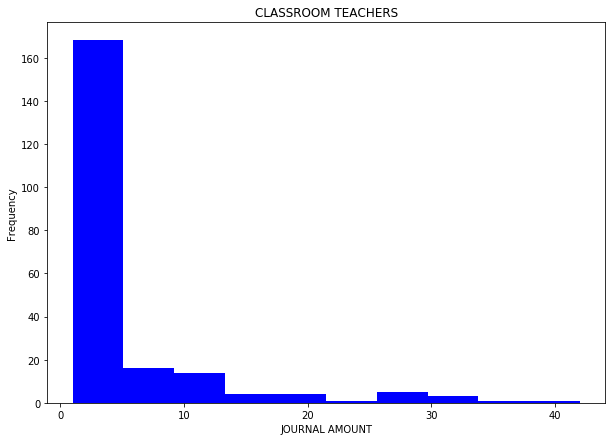

In [651]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('CLASSROOM TEACHERS', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `ADDITIONAL DIFFERENTIAL`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [652]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('ADDITIONAL DIFFERENTIAL')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21481,11351,01 -100-135-100-00-00-511100-,01,100,135,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/12,412,2017-06-28,PRJ,170630,0170630,0170630,nan,NaN,38.35,nan,5877.66,nan,nan,nan,3
22248,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 1,115,2016-07-20,PRJ,CITY,0170715,0170715,nan,NaN,307.85,nan,535.65,nan,nan,nan,3
22249,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 1,128,2016-07-27,PRJ,CITY,0170724,0170724,nan,NaN,307.85,nan,843.50,nan,nan,nan,3
22250,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,10,2016-08-03,PRJ,CITY,0170801,0170801,nan,NaN,307.85,nan,1151.35,nan,nan,nan,3
22251,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,68,2016-08-10,PRJ,CITY,0170810,0170810,nan,NaN,322.60,nan,1473.95,nan,nan,nan,3
22252,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,125,2016-08-17,PRJ,CITY,0170821,0170821,nan,NaN,307.85,nan,1781.80,nan,nan,nan,3
22253,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,214,2016-08-24,PRJ,CITY,0170826,0170826,nan,NaN,307.85,nan,2089.65,nan,nan,nan,3
22254,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,229,2016-08-31,PRJ,CITY,0170834,0170834,nan,NaN,307.85,nan,2397.50,nan,nan,nan,3
22255,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 3,53,2016-09-07,PRJ,CITY,0170903,0170903,nan,NaN,307.85,nan,2705.35,nan,nan,nan,3
22256,11411,01 -100-141-100-00-00-511100-,01,100,141,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 3,183,2016-09-14,PRJ,CITY,0170913,0170913,nan,NaN,307.85,nan,3013.20,nan,nan,nan,3


In [653]:
ADDITIONAL_DIFFERENTIAL_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('ADDITIONAL DIFFERENTIAL')]
ADDITIONAL_DIFFERENTIAL_dbscan.drop(columns=['dbscanclusters'], inplace=True)
ADDITIONAL_DIFFERENTIAL_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20062,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 1,120,2016-07-25,PRJ,CITY,0170728,0170728,nan,NaN,3216.67,nan,3216.67,nan,38300.00,nan,3
20063,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,78,2016-08-03,PRJ,CITY,0170818,0170818,nan,NaN,566.67,nan,3783.34,nan,nan,nan,5


In [654]:
ADDITIONAL_DIFFERENTIAL_converged_outliers = pd.concat([ADDITIONAL_DIFFERENTIAL_3_outliers,
                                                       ADDITIONAL_DIFFERENTIAL_dbscan])

In [655]:
ADDITIONAL_DIFFERENTIAL_converged_outliers = ADDITIONAL_DIFFERENTIAL_converged_outliers[ADDITIONAL_DIFFERENTIAL_converged_outliers.duplicated()]
ADDITIONAL_DIFFERENTIAL_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT


# `ADDITIONAL DIFFERENTIAL`
## `JOURNAL AMOUNT` Statistics

In [656]:
mask = expenditures['ACCOUNT DESC'] == 'ADDITIONAL DIFFERENTIAL'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,859.00
mean,673.90
std,1216.44
min,12.57
25%,73.08
50%,126.93
75%,307.85
max,4778.80


Text(0.5, 0, 'JOURNAL AMOUNT')

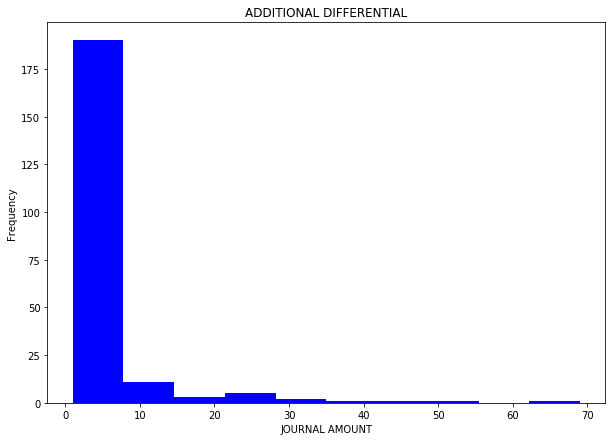

In [657]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('ADDITIONAL DIFFERENTIAL', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `OFFICE SUPPLIES`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [658]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('OFFICE SUPPLIES')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20334,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,209,2017-01-18,API,002632,20170307,179104,423145.00,NaN,5.18,nan,6501.10,nan,nan,nan,5
20369,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/12,362,2017-06-22,API,028310,20172515,187526,427026.00,NaN,57.63,nan,12438.69,nan,nan,nan,5
21926,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/12,364,2017-06-22,API,001161,20172572,187529,427073.00,NaN,50.00,nan,1148.04,nan,nan,nan,5
22373,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,102,2016-08-17,API,002632,20170015,170956,419309.00,NaN,5.18,nan,382.18,nan,nan,nan,5
22376,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,253,2016-10-20,API,002632,20170015,174483,420981.00,NaN,5.18,nan,405.49,nan,nan,nan,5
22377,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,192,2016-11-15,API,002632,20170015,175946,421743.00,NaN,5.18,nan,410.67,nan,nan,nan,5
22378,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,99,2016-12-07,API,002632,20170015,176961,422234.00,NaN,5.18,nan,415.85,nan,nan,nan,5
22380,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,244,2017-01-19,API,005754,20171380,179255,423194.00,NaN,52.10,nan,617.95,nan,nan,nan,5
22382,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,387,2017-02-22,API,002632,20170015,180731,423903.00,NaN,5.18,nan,625.72,nan,nan,nan,5
22383,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,297,2017-03-20,API,002632,20170015,182325,424781.00,NaN,5.18,nan,630.90,nan,nan,nan,5


In [659]:
OFFICE_SUPPLIES_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('OFFICE SUPPLIES')]
OFFICE_SUPPLIES_dbscan.drop(columns=['dbscanclusters'], inplace=True)
OFFICE_SUPPLIES_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20309,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,403,2016-09-29,API,004023,20170558,173077,420378.00,NaN,1719.59,nan,3044.17,nan,nan,nan,1
20329,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,323,2016-12-22,API,014955,20171037,177909,422519.00,NaN,1923.70,nan,5692.15,nan,nan,nan,1


In [660]:
OFFICE_SUPPLIES_converged_outliers = pd.concat([OFFICE_SUPPLIES_5_outliers_a,
                                               OFFICE_SUPPLIES_5_outliers_b,
                                               OFFICE_SUPPLIES_6_outliers_a,
                                               OFFICE_SUPPLIES_6_outliers_b,
                                               OFFICE_SUPPLIES_dbscan])

In [661]:
OFFICE_SUPPLIES_converged_outliers = OFFICE_SUPPLIES_converged_outliers[OFFICE_SUPPLIES_converged_outliers.duplicated()]
OFFICE_SUPPLIES_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20335,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,217,2017-01-18,API,007017,20171391,179161,423125.00,NaN,542.00,nan,7043.10,nan,nan,nan,5
21911,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,236,2017-02-11,API,001319,20171518,180163,423722.00,NaN,595.00,nan,-766.83,nan,nan,nan,5
21912,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,236,2017-02-11,API,001319,20171518,180164,423723.00,NaN,695.00,nan,-71.83,nan,nan,nan,6
21915,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/10,48,2017-04-04,API,019499,20171931,183212,425182.00,NaN,62.00,nan,331.95,nan,nan,nan,6
21926,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/12,364,2017-06-22,API,001161,20172572,187529,427073.00,NaN,50.00,nan,1148.04,nan,nan,nan,5
22373,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,102,2016-08-17,API,002632,20170015,170956,419309.00,NaN,5.18,nan,382.18,nan,nan,nan,5
22376,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,253,2016-10-20,API,002632,20170015,174483,420981.00,NaN,5.18,nan,405.49,nan,nan,nan,5
22377,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,192,2016-11-15,API,002632,20170015,175946,421743.00,NaN,5.18,nan,410.67,nan,nan,nan,5
22378,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,99,2016-12-07,API,002632,20170015,176961,422234.00,NaN,5.18,nan,415.85,nan,nan,nan,5
22380,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,244,2017-01-19,API,005754,20171380,179255,423194.00,NaN,52.10,nan,617.95,nan,nan,nan,5


# `OFFICE SUPPLIES`
## `JOURNAL AMOUNT` Statistics

In [662]:
mask = expenditures['ACCOUNT DESC'] == 'OFFICE SUPPLIES'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,777.00
mean,381.56
std,794.01
min,1.25
25%,49.98
50%,195.00
75%,584.13
max,13054.92


Text(0.5, 0, 'JOURNAL AMOUNT')

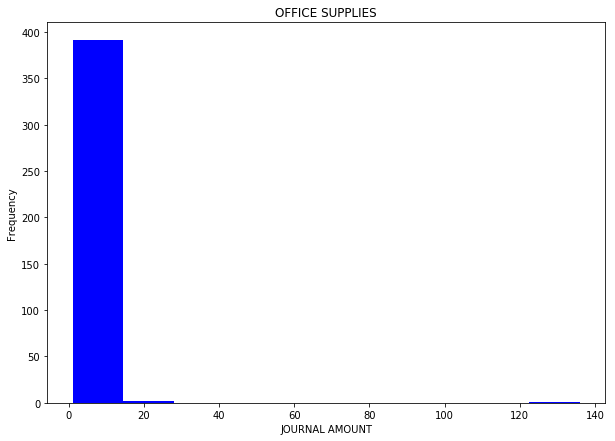

In [663]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('OFFICE SUPPLIES', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `TUITION TO NON PUBLIC SCHOOLS`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [664]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('TUITION TO NON PUBLIC SCHOOLS')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
40669,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/12,569,2017-06-30,API,003883,20175654,188107,427230.00,B,520.00,nan,3148955.93,nan,nan,nan,5
40670,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/12,569,2017-06-30,API,003883,20175654,188108,427230.00,B,520.00,nan,3149475.93,nan,nan,nan,5
40672,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/12,569,2017-06-30,API,003883,20175654,188110,427230.00,B,520.00,nan,3150385.93,nan,nan,nan,5
40024,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,000388,20175409,173394,420522.00,B,66.31,nan,245525.63,nan,nan,nan,6
40121,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,313,2016-10-24,API,000388,20175544,174730,421187.00,B,643.50,nan,790457.51,nan,nan,nan,6
40032,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175411,173412,420574.00,B,77.70,nan,264212.74,nan,nan,nan,7
39995,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173035,420397.00,B,838.50,nan,22553.30,nan,nan,nan,8
39996,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173036,420397.00,B,838.50,nan,23391.80,nan,nan,nan,8
40028,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173406,420573.00,B,80.75,nan,258923.35,nan,nan,nan,8
40029,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173408,420573.00,B,80.75,nan,259004.10,nan,nan,nan,8


In [665]:
TUITION_TO_NON_PUBLIC_SCHOOLS_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('TUITION TO NON PUBLIC SCHOOLS')]
TUITION_TO_NON_PUBLIC_SCHOOLS_dbscan.drop(columns=['dbscanclusters'], inplace=True)
TUITION_TO_NON_PUBLIC_SCHOOLS_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39995,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173035,420397.00,B,838.50,nan,22553.30,nan,nan,nan,8
39996,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173036,420397.00,B,838.50,nan,23391.80,nan,nan,nan,8


In [666]:
TUITION_TO_NON_PUBLIC_SCHOOLS_converged_outliers = pd.concat([TUITION_TO_NON_PUBLIC_SCHOOLS_5_outliers,
                                                             TUITION_TO_NON_PUBLIC_SCHOOLS_6_outliers,
                                                             TUITION_TO_NON_PUBLIC_SCHOOLS_7_outliers,
                                                             TUITION_TO_NON_PUBLIC_SCHOOLS_8_outliers,
                                                             TUITION_TO_NON_PUBLIC_SCHOOLS_9_outliers,
                                                             TUITION_TO_NON_PUBLIC_SCHOOLS_dbscan
                                                             ])

In [667]:
TUITION_TO_NON_PUBLIC_SCHOOLS_converged_outliers = TUITION_TO_NON_PUBLIC_SCHOOLS_converged_outliers[TUITION_TO_NON_PUBLIC_SCHOOLS_converged_outliers.duplicated()]
TUITION_TO_NON_PUBLIC_SCHOOLS_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39995,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173035,420397.00,B,838.50,nan,22553.30,nan,nan,nan,8
39996,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173036,420397.00,B,838.50,nan,23391.80,nan,nan,nan,8
40030,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173409,420573.00,B,884.60,nan,259888.70,nan,nan,nan,8
40541,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/11,309,2017-05-23,API,003883,20175654,185658,426256.00,B,910.00,nan,2253539.25,nan,nan,nan,9


# `TUITION TO NON PUBLIC SCHOOLS`
## `JOURNAL AMOUNT` Statistics

In [668]:
mask = expenditures['ACCOUNT DESC'] == 'TUITION TO NON PUBLIC SCHOOLS'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,702.00
mean,6843.22
std,3651.10
min,66.31
25%,4751.50
50%,6744.50
75%,8745.98
max,21343.06


Text(0.5, 0, 'JOURNAL AMOUNT')

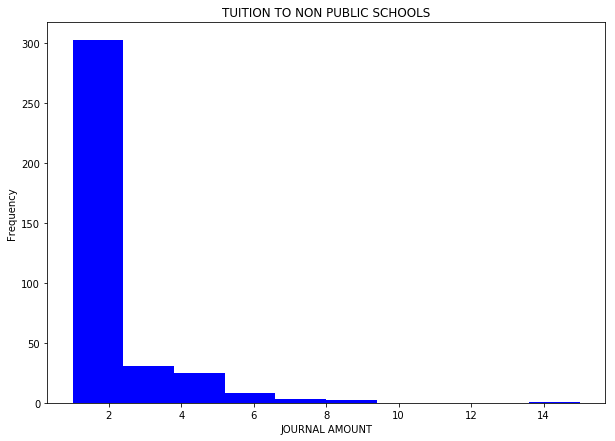

In [669]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('TUITION TO NON PUBLIC SCHOOLS', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `TAX TITLE`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [670]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('TAX TITLE')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
23055,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 4,255,2016-10-20,API,025815,20170813,174505,420860.00,NaN,750.00,nan,112875.65,nan,nan,nan,7


In [671]:
TAX_TITLE_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('TAX TITLE')]
TAX_TITLE_dbscan.drop(columns=['dbscanclusters'], inplace=True)
TAX_TITLE_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
22922,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 2,97,2016-08-16,API,000059,20170154,170846,419280.00,NaN,3100.00,nan,19697.67,nan,nan,nan,3
22923,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 2,100,2016-08-16,API,003904,NaN,170926,419262.00,NaN,6525.00,nan,26222.67,nan,nan,nan,6


In [672]:
TAX_TITLE_converged_outliers = pd.concat([TAX_TITLE_7_outliers,
                                         TAX_TITLE_dbscan])

In [673]:
TAX_TITLE_converged_outliers = TAX_TITLE_converged_outliers[TAX_TITLE_converged_outliers.duplicated()]
TAX_TITLE_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
23055,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 4,255,2016-10-20,API,025815,20170813,174505,420860.00,NaN,750.00,nan,112875.65,nan,nan,nan,7


# `TAX TITLE`
## `JOURNAL AMOUNT` Statistics

In [674]:
mask = expenditures['ACCOUNT DESC'] == 'TAX TITLE'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,544.00
mean,943.86
std,4055.33
min,3.00
25%,75.00
50%,75.00
75%,375.00
max,34409.52


Text(0.5, 0, 'JOURNAL AMOUNT')

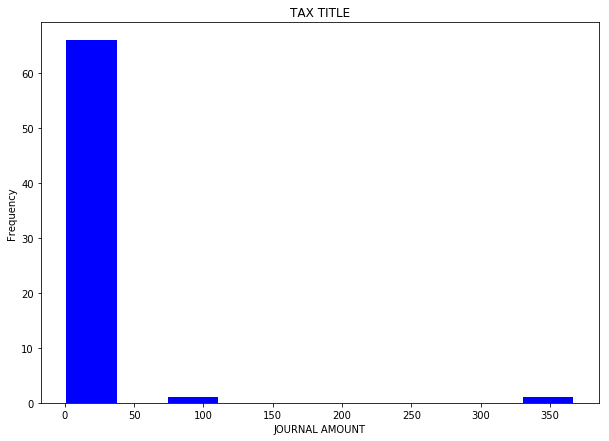

In [675]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('TAX TITLE', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `BUILDING SECRETARIES`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [676]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('BUILDING SECRETARIES')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
19336,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,813.23,nan,813.23,nan,46057.96,nan,8
19337,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,813.23,nan,1626.46,nan,nan,nan,8
19338,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,813.23,nan,2439.69,nan,nan,nan,8
19339,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,813.23,nan,3252.92,nan,nan,nan,8
19340,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,813.23,nan,4066.15,nan,nan,nan,8
19341,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,813.23,nan,4879.38,nan,nan,nan,8
19342,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,813.23,nan,5692.61,nan,nan,nan,8
19343,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,813.23,nan,6505.84,nan,nan,nan,8
19344,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,813.23,nan,7319.07,nan,nan,nan,8
19345,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,813.23,nan,8132.30,nan,nan,nan,8


In [677]:
BUILDING_SECRETARIES_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('BUILDING SECRETARIES')]
BUILDING_SECRETARIES_dbscan.drop(columns=['dbscanclusters'], inplace=True)
BUILDING_SECRETARIES_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18930,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 9,506,2017-03-17,PRJ,SCHOOL,1170320,1170320,nan,NaN,1431.73,nan,34868.89,nan,nan,nan,1
33417,320608,01 -300-320-000-08-06-522102-,01,300,320,000,08,06,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,1987.72,nan,52856.20,nan,nan,nan,1


In [678]:
BUILDING_SECRETARIES_converged_outliers = pd.concat([BUILDING_SECRETARIES_4_outliers,
                                                    BUILDING_SECRETARIES_8_outliers,
                                                    BUILDING_SECRETARIES_9_outliers_a,
                                                    BUILDING_SECRETARIES_9_outliers_b,
                                                    BUILDING_SECRETARIES_9_outliers_c,
                                                    BUILDING_SECRETARIES_dbscan])

In [679]:
BUILDING_SECRETARIES_converged_outliers = BUILDING_SECRETARIES_converged_outliers[BUILDING_SECRETARIES_converged_outliers.duplicated()]
BUILDING_SECRETARIES_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT


# `BUILDING SECRETARIES`
## `JOURNAL AMOUNT` Statistics

In [680]:
mask = expenditures['ACCOUNT DESC'] == 'BUILDING SECRETARIES'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,583.00
mean,1257.96
std,1112.13
min,813.23
25%,885.74
50%,928.81
75%,951.31
max,4837.26


Text(0.5, 0, 'JOURNAL AMOUNT')

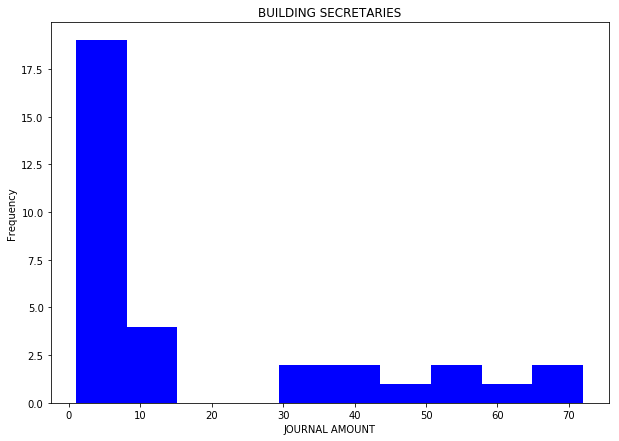

In [681]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('BUILDING SECRETARIES', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `ATHLETIC SUPPLIES & MATS`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [682]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('ATHLETIC SUPPLIES & MATS')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
37379,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 8,414,2017-02-23,API,020328,20175899,180847,423831.00,B,5934.00,nan,106975.41,nan,nan,nan,5
37072,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,383,2016-09-29,API,021755,20175036,172879,420392.00,NaN,7249.00,nan,22391.00,nan,nan,nan,7
37137,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,161,2016-10-17,API,028074,20175255,174144,421035.00,NaN,8334.00,nan,40428.75,nan,nan,nan,8


In [683]:
ATHLETIC_SUPPLIES_MATS_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('ATHLETIC SUPPLIES & MATS')]
ATHLETIC_SUPPLIES_MATS_dbscan.drop(columns=['dbscanclusters'], inplace=True)
ATHLETIC_SUPPLIES_MATS_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
37070,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,75,2016-09-07,API,009932,20175077,171969,419791.00,NaN,3290.00,nan,3290.00,nan,nan,nan,3
37071,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,94,2016-09-08,API,010300,20175144,172096,419705.00,NaN,11852.00,nan,15142.00,nan,nan,nan,1


In [684]:
ATHLETIC_SUPPLIES_MATS_converged_outliers = pd.concat([ATHLETIC_SUPPLIES_MATS_5_outliers,
                                                      ATHLETIC_SUPPLIES_MATS_7_outliers,
                                                      ATHLETIC_SUPPLIES_MATS_8_outliers,
                                                      ATHLETIC_SUPPLIES_MATS_dbscan])

In [685]:
ATHLETIC_SUPPLIES_MATS_converged_outliers = ATHLETIC_SUPPLIES_MATS_converged_outliers[ATHLETIC_SUPPLIES_MATS_converged_outliers.duplicated()]
ATHLETIC_SUPPLIES_MATS_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
37072,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,383,2016-09-29,API,021755,20175036,172879,420392.00,NaN,7249.00,nan,22391.00,nan,nan,nan,7
37137,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,161,2016-10-17,API,028074,20175255,174144,421035.00,NaN,8334.00,nan,40428.75,nan,nan,nan,8
37379,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 8,414,2017-02-23,API,020328,20175899,180847,423831.00,B,5934.00,nan,106975.41,nan,nan,nan,5


# `ATHLETIC SUPPLIES & MATS`
## `JOURNAL AMOUNT` Statistics

In [686]:
mask = expenditures['ACCOUNT DESC'] == 'ATHLETIC SUPPLIES & MATS'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,531.00
mean,306.24
std,1134.14
min,25.00
25%,75.00
50%,80.00
75%,116.00
max,11852.00


Text(0.5, 0, 'JOURNAL AMOUNT')

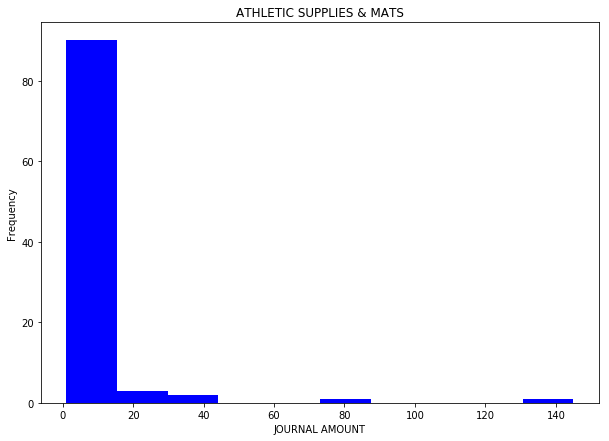

In [687]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('ATHLETIC SUPPLIES & MATS', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `TUITION TO MASS SCHOOLS`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [688]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('TUITION TO MASS SCHOOLS')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39561,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175249,175618,421599.00,NaN,4196.60,nan,686043.90,nan,nan,nan,4
39672,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175698,180390,423718.00,NaN,4112.60,nan,1335373.09,nan,nan,nan,4
39674,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175699,180392,423718.00,NaN,4175.60,nan,1348393.89,nan,nan,nan,4
39675,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175699,180393,423718.00,NaN,4175.60,nan,1352569.49,nan,nan,nan,4
39777,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/10,110,2017-04-10,API,007792,20175244,183488,425379.00,NaN,4023.63,nan,1920595.98,nan,nan,nan,4
39619,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,001712,20175697,178673,422967.00,NaN,4409.97,nan,1036357.92,nan,nan,nan,4
39620,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,001712,20175697,178674,422967.00,NaN,4409.97,nan,1040767.89,nan,nan,nan,4
39626,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,023568,20175403,178680,423002.00,NaN,4401.00,nan,1070875.27,nan,nan,nan,4
39761,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 9,355,2017-03-23,API,023216,20175660,182514,424688.00,NaN,4405.41,nan,1821508.69,nan,nan,nan,4
39854,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/12,41,2017-06-01,API,007792,20176381,186287,426670.00,NaN,565.88,nan,2308427.99,nan,nan,nan,5


In [689]:
TUITION_TO_MASS_SCHOOLS_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('TUITION TO MASS SCHOOLS')]
TUITION_TO_MASS_SCHOOLS_dbscan.drop(columns=['dbscanclusters'], inplace=True)
TUITION_TO_MASS_SCHOOLS_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39464,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173257,420577.00,NaN,7884.48,nan,101312.56,nan,nan,nan,7
39474,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,12,2016-10-06,API,023568,20175403,173390,420590.00,NaN,7335.00,nan,157879.76,nan,nan,nan,7


In [690]:
TUITION_TO_MASS_SCHOOLS_converged_outliers = pd.concat([TUITION_TO_MASS_SCHOOLS_4_outliers_a,
                                                       TUITION_TO_MASS_SCHOOLS_4_outliers_b,
                                                       TUITION_TO_MASS_SCHOOLS_5_outliers,
                                                       TUITION_TO_MASS_SCHOOLS_6_outliers_a,
                                                       TUITION_TO_MASS_SCHOOLS_6_outliers_b,
                                                       TUITION_TO_MASS_SCHOOLS_6_outliers_c,
                                                       TUITION_TO_MASS_SCHOOLS_dbscan])

In [691]:
TUITION_TO_MASS_SCHOOLS_converged_outliers = TUITION_TO_MASS_SCHOOLS_converged_outliers[TUITION_TO_MASS_SCHOOLS_converged_outliers.duplicated()]
TUITION_TO_MASS_SCHOOLS_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
39527,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,320,2016-10-25,API,023216,20175660,174757,421103.00,NaN,6438.72,nan,491169.22,nan,nan,nan,6
39854,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/12,41,2017-06-01,API,007792,20176381,186287,426670.00,NaN,565.88,nan,2308427.99,nan,nan,nan,5


# `TUITION TO MASS SCHOOLS`
## `JOURNAL AMOUNT` Statistics

In [692]:
mask = expenditures['ACCOUNT DESC'] == 'TUITION TO MASS SCHOOLS'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,541.00
mean,5346.03
std,2498.54
min,309.51
25%,4244.10
50%,5261.67
75%,6224.68
max,32928.00


Text(0.5, 0, 'JOURNAL AMOUNT')

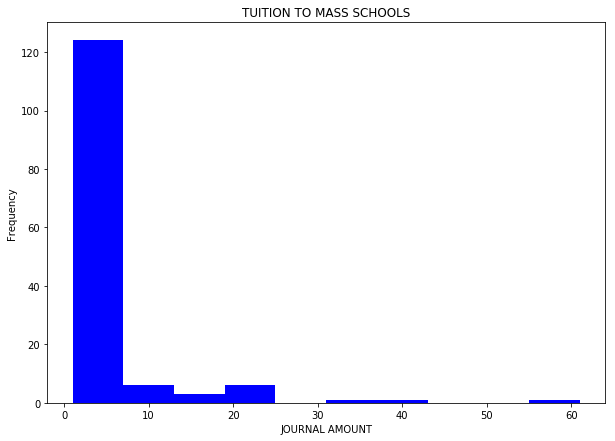

In [693]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('TUITION TO MASS SCHOOLS', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `SPED OUTSIDE TRANSPORTATION`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [694]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('SPED OUTSIDE TRANSPORTATION')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
35515,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,019401,20175087,172523,420098.00,NaN,240.00,nan,30675.00,nan,nan,nan,2
35517,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,002602,20175234,173057,420229.00,NaN,267.00,nan,35844.00,nan,nan,nan,2
35528,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,023212,20175164,173513,420419.00,NaN,220.00,nan,57770.00,nan,nan,nan,2
35574,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,311,2016-10-24,API,000932,20175550,174706,421177.00,NaN,290.00,nan,155517.00,nan,nan,nan,2
35579,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,311,2016-10-24,API,019685,20175535,174711,421190.00,NaN,250.00,nan,163862.00,nan,nan,nan,2
35610,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 5,88,2016-11-08,API,023212,20175539,175444,421475.00,NaN,250.00,nan,259365.00,nan,nan,nan,2
35613,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 5,88,2016-11-08,API,023212,20175424,175447,421475.00,NaN,270.00,nan,264550.00,nan,nan,nan,2
35639,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 6,91,2016-12-07,API,028535,20175833,177043,422173.00,NaN,242.19,nan,324287.19,nan,nan,nan,2
35640,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 6,91,2016-12-07,API,028535,20175833,177044,422173.00,NaN,269.10,nan,324556.29,nan,nan,nan,2
35884,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/10,64,2017-04-05,API,000932,20175175,183307,425132.00,NaN,205.00,nan,940715.13,nan,nan,nan,2


In [695]:
SPED_OUTSIDE_TRANSPORTATION_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('SPED OUTSIDE TRANSPORTATION')]
SPED_OUTSIDE_TRANSPORTATION_dbscan.drop(columns=['dbscanclusters'], inplace=True)
SPED_OUTSIDE_TRANSPORTATION_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
35511,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,023212,20175164,172518,420031.00,NaN,3960.00,nan,24910.00,nan,nan,nan,3
35516,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,002602,20175336,173056,420229.00,NaN,4902.00,nan,35577.00,nan,nan,nan,4


In [696]:
SPED_OUTSIDE_TRANSPORTATION_converged_outliers = pd.concat([SPED_OUTSIDE_TRANSPORTATION_2_outliers,
                                                           SPED_OUTSIDE_TRANSPORTATION_3_outliers,
                                                           SPED_OUTSIDE_TRANSPORTATION_dbscan])

In [697]:
SPED_OUTSIDE_TRANSPORTATION_converged_outliers = SPED_OUTSIDE_TRANSPORTATION_converged_outliers[SPED_OUTSIDE_TRANSPORTATION_converged_outliers.duplicated()]
SPED_OUTSIDE_TRANSPORTATION_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT


# `SPED OUTSIDE TRANSPORTATION`
## `JOURNAL AMOUNT` Statistics

In [698]:
mask = expenditures['ACCOUNT DESC'] == 'SPED OUTSIDE TRANSPORTATION'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,525.00
mean,2526.08
std,1527.54
min,60.00
25%,1567.50
50%,2340.00
75%,3204.00
max,10880.00


Text(0.5, 0, 'JOURNAL AMOUNT')

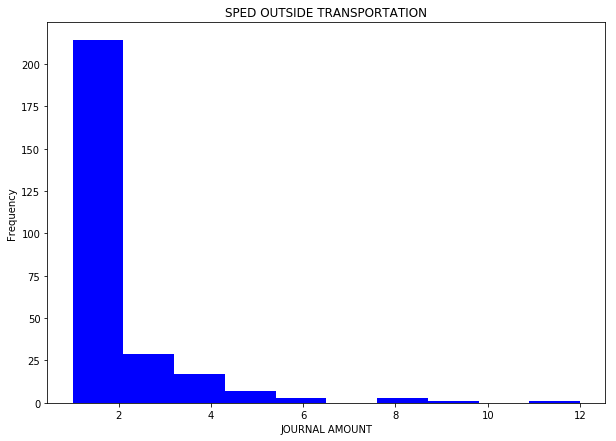

In [699]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('SPED OUTSIDE TRANSPORTATION', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `ASSISTANT PRINCIPALS`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [700]:
benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('ASSISTANT PRINCIPALS')]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
32917,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,2100.65,nan,2100.65,nan,108010.64,nan,2
32918,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,2100.65,nan,4201.30,nan,nan,nan,2
32919,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,2100.65,nan,6301.95,nan,nan,nan,2
32920,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,2100.65,nan,8402.60,nan,nan,nan,2
32921,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,2100.65,nan,10503.25,nan,nan,nan,2
32922,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,2100.65,nan,12603.90,nan,nan,nan,2
32923,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,2100.65,nan,14704.55,nan,nan,nan,2
32924,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,2100.65,nan,16805.20,nan,nan,nan,2
32925,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,2100.65,nan,18905.85,nan,nan,nan,2
32926,320408,01 -300-320-000-08-04-522111-,01,300,320,000,08,04,522111,,ASSISTANT PRINCIPALS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,2100.65,nan,21006.50,nan,nan,nan,2


In [701]:
ASSISTANT_PRINCIPALS_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('ASSISTANT PRINCIPALS')]
ASSISTANT_PRINCIPALS_dbscan.drop(columns=['dbscanclusters'], inplace=True)
ASSISTANT_PRINCIPALS_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18991,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,32701.20,nan,212557.80,nan,nan,nan,3
19433,321108,01 -000-300-001-64-00-522111-,01,000,300,001,64,00,522111,,ASSISTANT PRINCIPALS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,32775.68,nan,213041.92,nan,nan,nan,3


In [702]:
ASSISTANT_PRINCIPALS_converged_outliers = pd.concat([ASSISTANT_PRINCIPALS_2_outliers,
                                                    ASSISTANT_PRINCIPALS_4_outliers,
                                                    ASSISTANT_PRINCIPALS_dbscan])

In [703]:
ASSISTANT_PRINCIPALS_converged_outliers = ASSISTANT_PRINCIPALS_converged_outliers[ASSISTANT_PRINCIPALS_converged_outliers.duplicated()]
ASSISTANT_PRINCIPALS_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT


# `ASSISTANT PRINCIPALS`
## `JOURNAL AMOUNT` Statistics

In [704]:
mask = expenditures['ACCOUNT DESC'] == 'ASSISTANT PRINCIPALS'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,505.00
mean,3771.52
std,4426.15
min,2008.13
25%,2021.83
50%,2042.96
75%,4096.96
max,63732.59


Text(0.5, 0, 'JOURNAL AMOUNT')

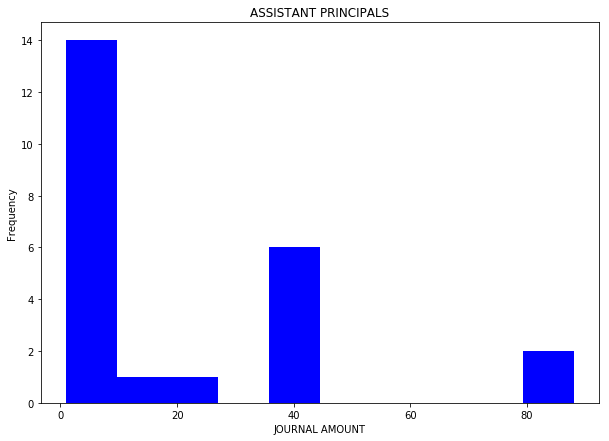

In [705]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('ASSISTANT PRINCIPALS', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)